# Computational Tools for Data Science

## Project Assignment, Group 41
## Notebook 1/2: Clustering

This notebook contains the clustering and corresponding data cleaning parts of our project. There are parts commented out in the notebook because of their long running time. In these cases, the outputs are saved and read in the next step from a file, so the notebook is still able to run.

# 1. Data preparation

The first part of the notebook contains the data preparation steps for the clustering.

In [1]:
#!pip install pyclustertend sentence_transformers scikit-learn geopandas contextily google-genai

#!pip install pyclustertend

import ast
import json
import math
import os
import re
import threading
import time
from concurrent.futures import ThreadPoolExecutor, as_completed
from pathlib import Path
from urllib.parse import urlparse

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

import requests
from tqdm.auto import tqdm
from PIL import Image, ImageOps, ImageFile
import concurrent

import geopandas as gpd
import contextily as ctx

from google import genai
from google.genai import types

import torch
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer

from sklearn.cluster import DBSCAN, KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler, MultiLabelBinarizer

from pyclustertend import hopkins

plt.style.use("ggplot")
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

c:\Users\lukac\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1.1. Exploring data
- Many columns seem to have missing data, 3 entirely and many >50%
- A few features are correlated and selection should take this into account
- Columns needed for later identification, not for clustering: id, name, host_id

In [2]:
# Read input data and create copy for cleaning
listings = pd.read_csv('./listings.csv')
listings_toClean = listings.copy()
listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,29118,https://www.airbnb.com/rooms/29118,20250627030604,2025-06-30,city scrape,Best Location in Cool Istedgade,NaN,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,Nana,2010-05-15,"Copenhagen, Denmark",I have a Master of Arts in Musicology and I wo...,within a few hours,100%,50%,f,https://a0.muscache.com/im/users/125230/profil...,https://a0.muscache.com/im/users/125230/profil...,Vesterbro,1.0,1.0,"['email', 'phone']",t,t,NaN,Vesterbro-Kongens Enghave,NaN,55.670230,12.555040,Entire rental unit,Entire home/apt,2,1.0,1 bath,1.0,1.0,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...",$900.00,7,14,5.0,5.0,14.0,14.0,5.0,14.0,NaN,t,6,7,17,18,2025-06-30,27,0,0,18,1,0,0.0,2010-06-17,2024-03-31,4.85,4.67,4.67,4.89,5.00,4.83,4.72,NaN,f,1,1,0,0,0.15
1,31094,https://www.airbnb.com/rooms/31094,20250627030604,2025-07-01,previous scrape,"Beautiful, spacious, central, renovated Penthouse","Welcome to our home, we hope you will enjoy Wo...","What else is nearby?<br />To be honest, We thi...",https://a0.muscache.com/pictures/miso/Hosting-...,129976,https://www.airbnb.com/users/show/129976,Ebbe,2010-05-22,"Copenhagen, Denmark","Hi and welcome. My name is Ebbe, I am a medica...",NaN,NaN,NaN,f,https://a0.muscache.com/im/users/129976/profil...,https://a0.muscache.com/im/users/129976/profil...,Vesterbro,1.0,1.0,"['email', 'phone']",t,t,"Copenhagen, Capital Region of Denmark, Denmark",Vesterbro-Kongens Enghave,NaN,55.666602,12.555283,Entire condo,Entire home/apt,6,NaN,1.5 baths,4.0,NaN,"[""Coffee maker: drip coffee maker, espresso ma...",NaN,3,10,3.0,3.0,10.0,10.0,3.0,10.0,NaN,t,0,0,0,0,2025-07-01,19,0,0,0,0,0,NaN,2010-08-16,2022-08-22,4.88,4.82,4.88,4.87,4.82,4.80,4.53,NaN,f,1,1,0,0,0.10
2,32379,https://www.airbnb.com/rooms/32379,20250627030604,2025-06-28,city scrape,"155 m2 artist flat on Vesterbro, with 2 bathrooms",You enter a narrow entrance and feel the good ...,"Værnedamsvej area is super hip area, we call i...",https://a0.muscache.com/pictures/miso/Hosting-...,140105,https://www.airbnb.com/users/show/140105,Lise,2010-06-07,"Copenhagen, Denmark",As profession - Set and Costumedesigner for Av...,within an hour,100%,100%,t,https://a0.muscache.com/im/users/140105/profil...,https://a0.muscache.com/im/users/140105/profil...,Vesterbro,3.0,4.0,"['email', 'phone']",t,t,"Copenhagen, V, Denmark",Vesterbro-Kongens Enghave,NaN,55.672638,12.552493,Entire rental unit,Entire home/apt,4,2.0,2 baths,2.0,3.0,"[""Dedicated workspace"", ""Hot water"", ""Iron"", ""...","$2,282.00",3,5,3.0,3.0,5.0,5.0,3.0,5.0,NaN,t,0,4,

In [3]:
#check % missingness
missing_frac = listings.isnull().sum().sort_values(ascending=False)/len(listings)
missing_pct = (missing_frac * 100).round(1)
pd.DataFrame(missing_pct)

,0
license,100.0
calendar_updated,100.0
neighbourhood_group_cleansed,100.0
host_neighbourhood,78.0
neighborhood_overview,63.7
neighbourhood,63.7
host_about,59.0
bathrooms,39.0
beds,39.0
price,39.0


In [4]:
#explore csv properties
print(listings.shape)
print(listings.info())
print(listings.describe())
print(listings.columns)

(22684, 79)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22684 entries, 0 to 22683
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            22684 non-null  int64  
 1   listing_url                                   22684 non-null  object 
 2   scrape_id                                     22684 non-null  int64  
 3   last_scraped                                  22684 non-null  object 
 4   source                                        22684 non-null  object 
 5   name                                          22684 non-null  object 
 6   description                                   22070 non-null  object 
 7   neighborhood_overview                         8225 non-null   object 
 8   picture_url                                   22684 non-null  object 
 9   host_id                                       226

## 1.2. Exploring feature redundancy
Strong correlations (high r):
- hosts host_listings_count / host_total_listings_count /calculated_host_listings_count / calculated_host_listings_count_entire_homes / calculated_host_listings_count_private_rooms / calculated_host_listings_count_shared_rooms
- accommodates / bedrooms / beds
- minimum_nights / minimum_minimum_nights / maximum_nights / maximum_maximum_nights / maximum_nights_avg_ntm
- availability_30/60/90/365 / availability_eoy / number_of_reviews / number_of_reviews_ltm / l30d / ly / estimated_occupancy_l365d
- review_scores_rating, accuracy, cleanliness, checkin, communication, location, value

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,1.000000,NaN,0.379536,0.054313,0.034297,NaN,0.007925,-0.011297,-0.055491,-0.059971,-0.108099,-0.145653,-0.028925,-0.198846,-0.029983,-0.021078,-0.257534,-0.251764,-0.025889,-0.255885,NaN,0.171913,0.167164,0.171042,0.206219,-0.272951,0.001138,0.073667,0.183697,-0.071470,-0.010687,-0.100977,0.015876,-0.024294,0.026879,-0.052745,-0.039821,0.013369,-0.005115,NaN,0.037056,0.037186,-0.003698,0.008890,0.202212
scrape_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
host_id,0.379536,NaN,1.000000,0.092446,0.056227,NaN,-0.012812,0.023813,-0.056097,-0.076238,-0.106042,-0.084603,-0.028870,-0.042018,-0.025551,-0.019427,-0.053324,-0.045291,-0.021108,-0.048542,NaN,0.112081,0.136810,0.149721,0.170997,-0.068758,0.074163,0.093568,0.160320,0.045486,0.064219,0.049375,-0.107633,-0.111772,-0.076291,-0.109372,-0.118291,-0.035807,-0.091101,NaN,0.077737,0.075803,0.048646,0.020679,0.180742
host_listings_count,0.054313,NaN,0.092446,1.000000,0.953530,NaN,-0.006361,0.062631,0.052690,-0.013571,0.036147,0.059669,-0.021946,0.228978,-0.019187,-0.014793,-0.014434,0.157902,-0.018118,0.076824,NaN,-0.020245,-0.014819,-0.006903,0.085267,-0.016158,-0.001131,-0.027352,0.001890,0.000404,-0.013902,0.013477,-0.128634,-0.121169,-0.060807,-0.118265,-0.138927,-0.033569,-0.125691,NaN,0.787738,0.786316,0.059795,0.012138,0.011864
host_total_listings_count,0.034297,NaN,0.056227,0.953530,1.000000,NaN,-0.000508,0.060622,0.049296,-0.010041,0.038158,0.062739,-0.022653,0.243612,-0.020287,-0.014964,-0.053293,0.163533,-0.018643,0.061130,NaN,-0.018205,-0.016575,-0.011706,0.095808,-0.019169,-0.008363,-0.032065,-0.006484,-0.006306,-0.022337,0.000716,-0.083721,-0.081736,-0.039319,-0.075270,-0.084961,-0.008257,-0.091951,NaN,0.879821,0.880147,0.018982,0.003169,-0.002927
neighbourhood_group_cleansed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,0.007925,NaN,-0.012812,-0.006361,-0.000508,NaN,1.000000,-0.236432,-0.058414,-0.045007,-0.066143,-0.062648,0.006115,-0.019436,0.003664,0.004260,-0.030463,-0.028712,0.003392,-0.029832,NaN,0.011035,0.005422,0.002284,-0.002419,-0.027062,-0.024574,-0.029252,-0.005000,-0.025851,-0.033802,-0.028595,-0.007633,-0.011208,-0.007790,-0.003524,-0.004674,-0.039284,-0.018560,NaN,-0.000939,0.000258,-0.031957,0.002907,-0.028644
longitude,-0.011297,NaN,0.023813,0.062631,0.060622,NaN,-0.236432,1.000000,0.014713,0.006320,0.005191,0.038187,-0.004115,0.028835,-0.003538,0.002646,0.025969,0.037740,0.001309,0.032902,NaN,0.010091,0.022042,0.025827,0.034738,0.059792,0.062273,0.052583,0.034096,0.060756,0.067927,0.113745,0.015276,0.018121,0.026148,-0.001015,-0.008309,0.136803,0.001232,NaN,0.053793,0.053728,-0.003970,0.027176,0.062405
accommodates,-0.055491,NaN,-0.056097,0.052690,0.049296,NaN,-0.058414,0.014713,1.000000,0.416313,0.801675,0.753808,-0.009571,0.068455,-0.015809,-0.013629,0.054406,0.059885,-0.014784,0.

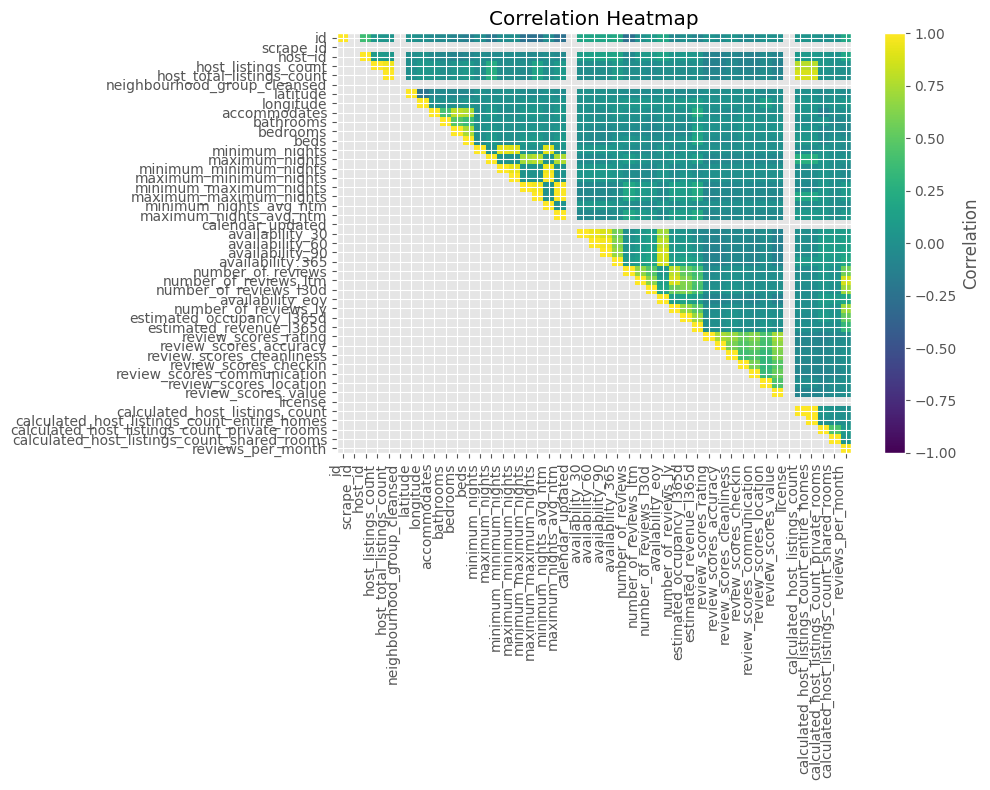

In [5]:
# keep only numeric columns
num_df = listings.copy().select_dtypes(include='number')

# correlation matrix on numeric cols only
corr = num_df.corr()
display(corr)

#plot heatmap
mask = np.tril(np.ones_like(corr, dtype=bool), k=-1)
corr_masked = np.ma.array(corr.values, mask=mask)

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(corr_masked, aspect="auto", vmin=-1, vmax=1)
ax.set_xticks(np.arange(len(corr.columns)))
ax.set_yticks(np.arange(len(corr.columns)))
ax.set_xticklabels(corr.columns, rotation=90, ha="right")
ax.set_yticklabels(corr.columns)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Correlation", rotation=90)

ax.set_title("Correlation Heatmap")
plt.tight_layout()
plt.show()

In [6]:
#show features that are more than 50% correlated
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)  # if you ever need it


def show_correlations(corr):
    mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
    corr_upper = corr.where(mask)
    high_corr = (corr_upper.stack().reset_index()
        .rename(columns={"level_0": "feature_1", "level_1": "feature_2", 0: "corr"})
        .sort_values("corr", ascending=False)
    )
    high_corr = high_corr[high_corr["corr"].abs() >= 0.5]
    return high_corr

show_correlations(corr)

,feature_1,feature_2,corr
810,calculated_host_listings_count,calculated_host_listings_count_entire_homes,0.999068
496,maximum_maximum_nights,maximum_nights_avg_ntm,0.991427
444,maximum_minimum_nights,minimum_nights_avg_ntm,0.989455
471,minimum_maximum_nights,maximum_nights_avg_ntm,0.988373
469,minimum_maximum_nights,maximum_maximum_nights,0.962280
589,availability_60,availability_90,0.961695
79,host_listings_count,host_total_listings_count,0.953530
417,minimum_minimum_nights,minimum_nights_avg_ntm,0.947389
567,availability_30,availability_60,0.938498
414,minimum_minimum_nights,maximum_minimum_nights,0.922134


## 1.3 Data cleaning

Reading the data from the listings.csv, then selecting those, that seem useful for clustering. Then going through them individually to decide if they can actually be used (eg. not too many rows with Nan values, etc.)

### 1.3.1. Price

- 8853 listings do not have a price. It looks like they are from the previous scrape and may be simply unlisted. They also have way less availability. Spot check of the data, however, shows that they are mostly valid and filled out listings. We hypothesise that these are airbnbs that are not on the market permamently (e.g., people renting out their own flat when away) or listings currently de-listed from the platform. Overall, they seem valid apart from the lack of price.

- Since this seems like a major parameter in the clustering, we have to drop them if we are investigating relationships to price.

- The values are stored as strings, so we have to convert them to integers.

- Prices are heavily skewed - rather than clipping eg from the 95th percentile, it makes more sense to clip the major outliers (ie, x SDs from the mean in both directions) using median absolute deviation.  

- Check at the end: distribution of prices seem "healthy"

In [7]:
#Doing some basic checks on the values
distinct_price = listings_toClean['price'].unique()
nan_count_price = listings_toClean['price'].isna().sum()
price_dtype = listings_toClean['price'].dtypes

print("price")
print(f"'NaN price': {nan_count_price}")
print(distinct_price)
print(price_dtype)

price
'NaN price': 8853
['$900.00' nan '$2,282.00' ... '$2,302.00' '$494.00' '$2,386.00']
object


In [8]:
listings_toClean[listings_toClean['price'].isna()]['source'].value_counts(dropna=False)

source
previous scrape    8853
Name: count, dtype: int64

In [9]:
listings_toClean['source'].value_counts(dropna=False)

source
city scrape        13831
previous scrape     8853
Name: count, dtype: int64

In [10]:
listings_toClean['availability_365'].mean()

np.float64(85.6876653147593)

In [11]:
listings_toClean.groupby('source')['availability_365'].median()

source
city scrape        102.0
previous scrape      0.0
Name: availability_365, dtype: float64

In [12]:
listings_toClean.groupby('source')['availability_365'].mean()

source
city scrape        135.789603
previous scrape      7.413645
Name: availability_365, dtype: float64

In [13]:
# Drop Nan, convert column to integer
listings_toClean = listings_toClean.dropna(subset='price').copy()

listings_toClean['price'] = listings_toClean['price'].replace('[$,]', '', regex=True).astype(float).astype(int)

print(f"Data type of 'price' column: {listings_toClean['price'].dtypes}")
print(listings_toClean[['price']].head())

Data type of 'price' column: int64
   price
0    900
2   2282
3    589
4   2223
5   1760


In [14]:
#calc MAD and remove outliers > 5SDs from median
listings_toClean['has_price'] = listings_toClean['price'].notna()
price = listings_toClean['price']
price_valid = price.dropna()

mad_price = stats.median_abs_deviation(listings_toClean['price'], nan_policy='omit')

median = np.nanmedian(price)
diff_from_med = (price-median).abs()
threshold = 5*mad_price

listings_toClean['price_outlier'] = (listings_toClean['has_price'] & (diff_from_med>threshold))

print(mad_price, median, threshold)
listings_toClean['price_outlier'].value_counts()

335.0 1182.0 1675.0


price_outlier
False    13100
True       731
Name: count, dtype: int64

array([<Axes: title={'center': 'False'}>,
       <Axes: title={'center': 'True'}>], dtype=object)

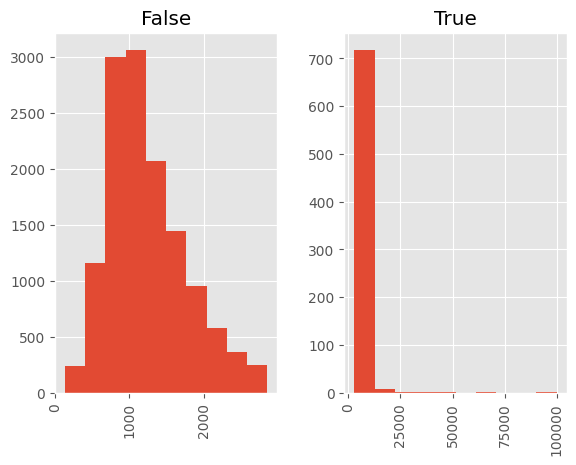

In [15]:
#visualise histogram
listings_toClean.hist(column='price', by='price_outlier')

### 1.3.2. Amenities

- Amenities are stored in arrays inside the cells

- The labels are unfortunately not standardised and seem to be free entry. A majority of the amenities are eg tv size and the number can thus be significantly reduced by conflating them. 

- We calculted the total number of amenities per listing, as a simplification method.

In [16]:
# Getting an idea about the data in the amenities column
listings_subset = listings_toClean.head()
amenities_df = listings_subset['amenities'].str.get_dummies(sep=', ')
amenities_df.head()

,"""42 inch TV with Netflix","""Baby bath""","""Baking sheet""","""Bathtub""","""Bed linens""","""Blender""","""Books and reading material""","""Carbon monoxide alarm""","""Children\u2019s books and toys""","""Children\u2019s dinnerware""","""Cleaning products""","""Clothing storage: closet""","""Coffee maker: Nespresso""","""Coffee maker: french press","""Coffee""","""Cooking basics""","""Courtyard view""","""Dining table""","""Dishes and silverware""","""Dishwasher""","""Dryer""]","""Drying rack for clothing""","""EV charger""","""Essentials""","""Fire extinguisher""","""First aid kit""","""Free dryer \u2013 In unit""","""Free parking on premises""","""Free washer \u2013 In unit""","""Freezer""","""Hair dryer""","""Hangers""","""Heating""","""Host greets you""","""Hot water kettle""","""Hot water""","""Induction stove""","""Iron""","""Kitchen""","""Lockbox""","""Long term stays allowed""","""Microwave""","""Outdoor furniture""","""Oven""","""Pack \u2019n play/Travel crib""","""Paid parking off premises""","""Patio or balcony""","""Portable fans""","""Private entrance""","""Private hot tub""","""Private patio or balcony""","""Record player""","""Refrigerator""","""Room-darkening shades""","""Self check-in""","""Shampoo""","""Shared backyard \u2013 Not fully fenced""","""Shared backyard""","""Shared beach access""","""Shower gel""","""Smoke alarm""","""Smoke alarm""]","""Stove""","""TV with Chromecast","""TV with Chromecast""","""TV with standard cable""","""Toaster""","""Washer""","""Wifi""","""Wifi""]","""Wine glasses""",Apple TV,"Apple TV""",Disney+,"HBO Max""","Nespresso""",Netflix,"[""Backyard""","[""Dedicated workspace""","[""Freezer"""
0,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,1,0,0,1,0,0,1,0,1,1,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,1,0,0,0,0,0,0,1,0,0
2,0,0,0,1,1,0,0,1,1,0,1,0,0,0,0,1,1,1,1,1,1,1,0,1,0,1,0,0,0,0,1,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,0,1,0,1,0,0,1,1,1,1,1,0,0,1,1,0,1,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0
4,1,0,0,0,1,0,1,0,0,0,1,1,0,1,0,1,0,1,1,1,0,1,0,1,0,0,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,0,1,0,0,0,0,1,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,1,0,0,1,0
5,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,1,0,1,1,1,0,1,1,1,0,0,1,0,1,0,1,0,1,0,1,1,0,1,1,0,0,1,1,1,0,1,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,1,1,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,0,1


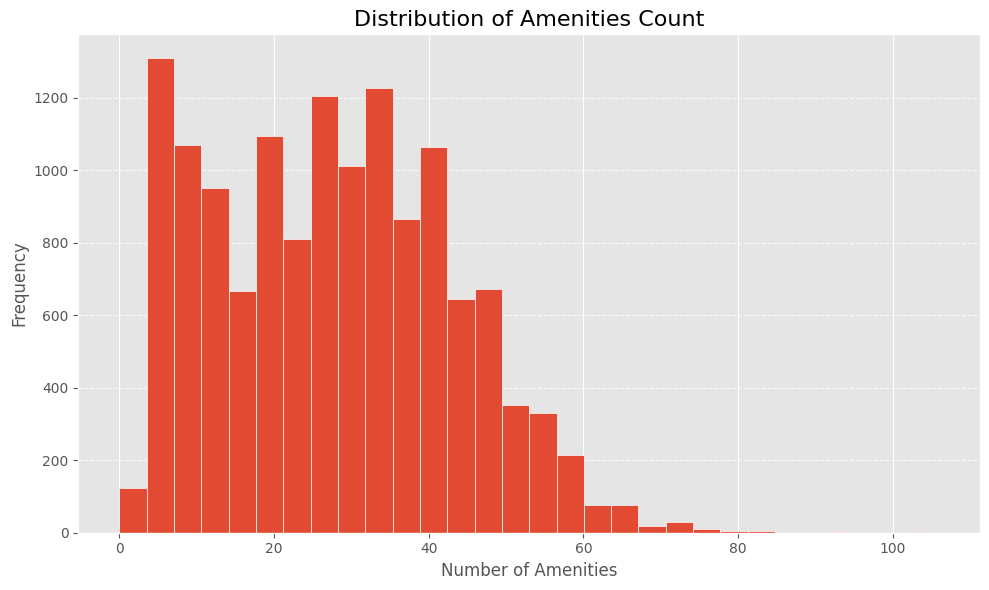

In [17]:
# Calculate amenities_count, and check its distribution
listings_toClean['amenities_count'] = listings_toClean['amenities'].apply(lambda x: len(eval(x)))

plt.figure(figsize=(10, 6))
plt.hist(listings_toClean['amenities_count'], bins=30,edgecolor='white')
plt.title('Distribution of Amenities Count', fontsize=16)
plt.xlabel('Number of Amenities', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 1.3.3. Accommodates

Accommodates has no NaN values.

In [18]:
# Basic checks on the values
nan_count_accomodates = listings_toClean['accommodates'].isna().sum()
distinct_accommodates = listings_toClean['accommodates'].unique()
accomodates_dtype = listings_toClean['accommodates'].dtypes

print(f"'NaN accommodates': {nan_count_accomodates}")
print("\nDistincts:")
print(distinct_accommodates)
print(accomodates_dtype)


'NaN accommodates': 0

Distincts:
[ 2  4  6  5  7  1  8  3 10 12  9 16 15 11 14]
int64


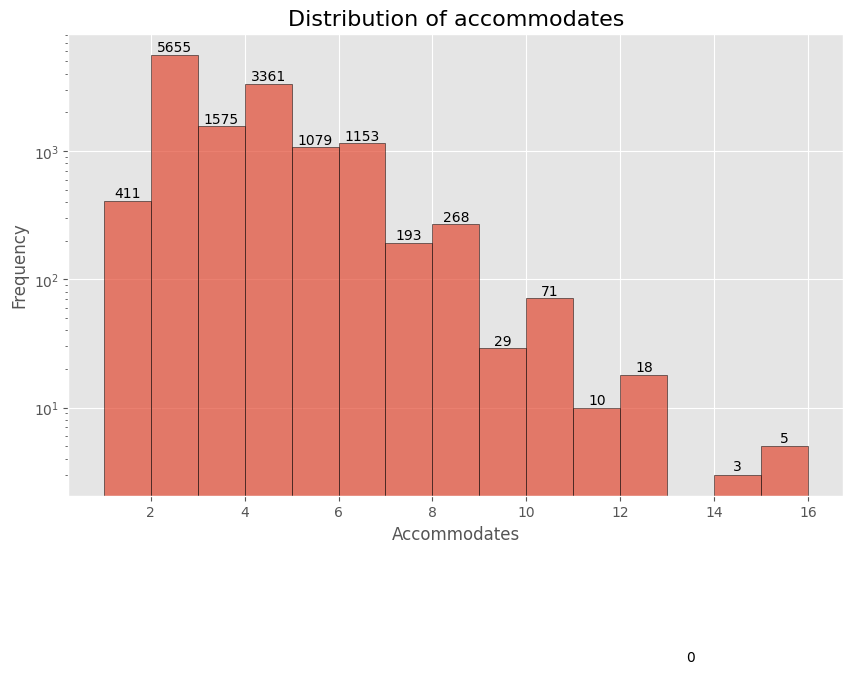

In [19]:
# Checking the values on a histogram
counts, bin_edges = np.histogram(listings_toClean['accommodates'], bins=15)

plt.figure(figsize=(10, 6))
plt.hist(listings_toClean['accommodates'], bins=15, edgecolor='black', alpha=0.7)
plt.title('Distribution of accommodates', fontsize=16)
plt.xlabel('Accommodates', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.yscale('log')

for i in range(len(counts)):
    bin_center = (bin_edges[i] + bin_edges[i + 1]) / 2
    plt.text(bin_center, counts[i] + 0.1, str(counts[i]), ha='center', va='bottom', fontsize=10)

plt.show()

### 1.3.4. Bedrooms

- Beds and accomodates should have a really similar meaning, and they have a small difference in most of the times, so we decided to just keep the accommodates column.

- Drop NaN values in bedrooms, and convert to integer

In [20]:
# Basic checks on the values

distinct_bedrooms = listings_toClean['bedrooms'].unique()
nan_count_bedrooms = listings_toClean['bedrooms'].isna().sum()
bedrooms_dtype = listings_toClean['bedrooms'].dtypes

distinct_beds = listings_toClean['beds'].unique()
nan_count_beds = listings_toClean['beds'].isna().sum()
beds_dtype = listings_toClean['beds'].dtypes

print("bedrooms")
print(f"'NaN bedrooms': {nan_count_bedrooms}")
print(distinct_bedrooms)
print(bedrooms_dtype)


print("\nbeds")
print(f"'NaN beds': {nan_count_beds}")
print("\n", distinct_beds)
print(bedrooms_dtype)

bedrooms
'NaN bedrooms': 2
[ 1.  2.  3.  4.  5.  7.  0.  6.  8. nan  9.]
float64

beds
'NaN beds': 3

 [ 1.  3.  2.  4.  6.  7.  0.  8.  5.  9. 15. nan 13. 10. 12. 11. 16.]
float64


In [21]:
# Checking the difference between 'accommodates' and 'beds'

listings_toClean['difference'] = listings_toClean['accommodates'] - listings_toClean['beds']

difference_counts = listings_toClean['difference'].value_counts()

print("Count of differences between 'accommodates' and 'beds':")
print(difference_counts)

Count of differences between 'accommodates' and 'beds':
difference
 1.0     6460
 2.0     3763
 3.0     1469
 0.0     1261
 4.0      468
 5.0      152
-1.0      119
 6.0       49
-2.0       36
 7.0       20
-3.0       10
 8.0        5
-5.0        4
 9.0        4
-4.0        3
-6.0        2
 12.0       2
 10.0       1
Name: count, dtype: int64


In [22]:
#convert to int
listings_toClean = listings_toClean.dropna(subset='bedrooms')
listings_toClean['bedrooms'] = listings_toClean['bedrooms'].astype(int)

### 1.3.5. Bathrooms
Bathrooms seems usable, so keeping that, dropping NaN values, and not using bathroom_text

In [23]:
distinct_bath = listings_toClean['bathrooms'].unique()
nan_count_bathrooms = listings_toClean['bathrooms'].isna().sum()
bath_dtype = listings_toClean['bathrooms'].dtypes

distinct_bathtext = listings_toClean['bathrooms_text'].unique()
nan_count_bathtext = listings_toClean['bathrooms_text'].isna().sum()
bathtext_dtype = listings_toClean['bathrooms_text'].dtypes

print("bathrooms")
print(f"'NaN bathrooms': {nan_count_bathrooms}")
print(distinct_bath)
print(bath_dtype)


print("\nbathrooms_text")
print(f"'NaN bathrooms_text': {nan_count_bathtext}")
print("\n", distinct_bathtext)
print(bathtext_dtype)

bathrooms
'NaN bathrooms': 5
[1.  2.  0.5 1.5 0.  3.  2.5 nan 5.  3.5 4.  8. ]
float64

bathrooms_text
'NaN bathrooms_text': 5

 ['1 bath' '2 baths' '1 shared bath' 'Half-bath' '1.5 baths' '0 baths'
 '3 baths' '2.5 baths' nan '1 private bath' 'Private half-bath' '5 baths'
 'Shared half-bath' '2 shared baths' '1.5 shared baths' '3.5 baths'
 '4 baths' '0 shared baths' '2.5 shared baths' '3 shared baths' '8 baths'
 '4 shared baths']
object


In [24]:
listings_toClean = listings_toClean.dropna(subset='bathrooms')

### 1.3.6. Property/room types

- property type: there were a lot of types, room_type only had 4 (entire home / private room / shared room / hotel room) --> only using room type

- there are only 17 shared/hotel rooms --> dropping them from the data

In [25]:
# Running basic checks on the values
property_type_counts = listings_toClean['property_type'].value_counts()
print("Property types types: ")
print(property_type_counts)

Property types types: 
property_type
Entire rental unit                    8117
Entire condo                          3166
Entire home                            752
Private room in rental unit            682
Private room in condo                  230
Entire townhouse                       223
Entire serviced apartment              130
Entire villa                           117
Private room in home                    90
Entire loft                             66
Private room in villa                   26
Entire guesthouse                       22
Room in hotel                           21
Private room in bed and breakfast       18
Private room in townhouse               18
Private room in hostel                  15
Houseboat                               14
Room in aparthotel                      13
Private room in boat                    11
Boat                                     7
Tiny home                                7
Private room in guest suite              7
Shared room in ho

In [26]:
# Running basic checks on the values
property_type_counts = listings_toClean['room_type'].value_counts()
print("\n\nRoom types: ")
print(property_type_counts)



Room types: 
room_type
Entire home/apt    12663
Private room        1142
Shared room           16
Hotel room             3
Name: count, dtype: int64


In [27]:
# # Keeping only entire homes and private rooms
# listings_toClean = listings_toClean[~listings_toClean['room_type'].isin(['Shared room', 'Hotel room'])]

### 1.3.7. Neighbourhood

 - neighbourhood_cleansed actually seems correct (based on unique values and a test plot)
 - also latitude and longitude should be fine, based on the nice plot

['Vesterbro-Kongens Enghave' 'sterbro' 'Indre By' 'Amager Vest' 'Nrrebro'
 'Frederiksberg' 'Bispebjerg' 'Valby' 'Amager st' 'Vanlse' 'Brnshj-Husum']


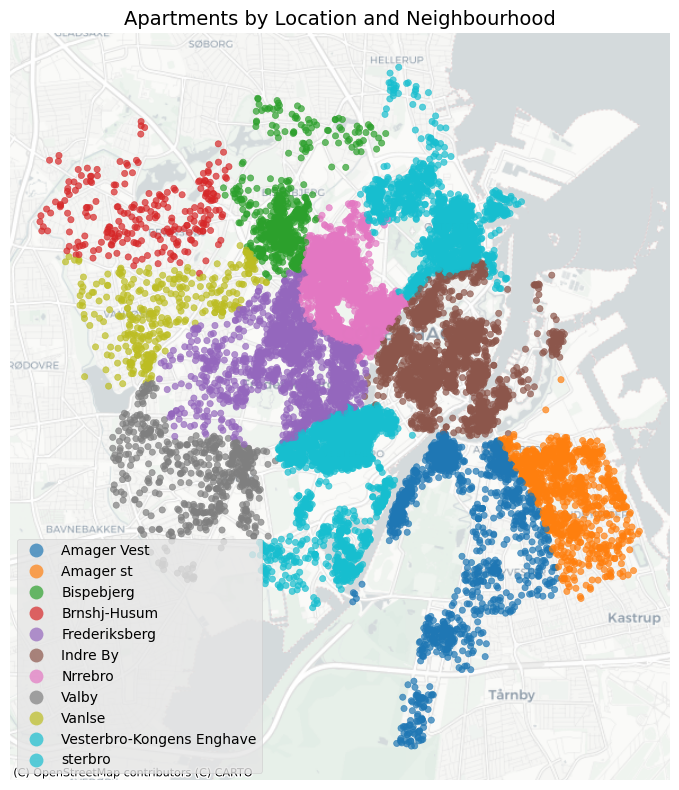

In [28]:
distinct_neighbourhoods = listings_toClean['neighbourhood_cleansed'].unique()
print(distinct_neighbourhoods)

#make geodf
gdf = gpd.GeoDataFrame(
    listings_toClean,
    geometry=gpd.points_from_xy(listings_toClean['longitude'], listings_toClean['latitude']),
    crs='EPSG:4326'  # WGS84 (lat/lon)
)
gdf = gdf.to_crs(epsg=3857) #convert to webmercator crs

#plot
fig, ax = plt.subplots(figsize=(12, 8))
gdf.plot(
    ax=ax,
    column='neighbourhood_cleansed',
    categorical=True,
    legend=True,
    cmap='tab10',
    markersize=20,
    alpha=0.7
)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)  #add basemap

# Add labels and title
ax.set_title('Apartments by Location and Neighbourhood', fontsize=14)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.set_axis_off()

plt.tight_layout()
plt.show()


### 1.3.8. Response time/rate

- host_response_time and host_response_rate were NaN in another ca. 2000 lines in the data, so we decided to just omit this column.

In [29]:
# Running basic checks on the data

nan_count_time = listings_toClean['host_response_time'].isna().sum()
nan_count_rate = listings_toClean['host_response_rate'].isna().sum()

print(f"'host_response_time': {nan_count_time}, 'host_response_rate': {nan_count_rate},")

print("All rows in the dataframe: ", len(listings_toClean))

'host_response_time': 1922, 'host_response_rate': 1922,
All rows in the dataframe:  13824


### 1.3.9. Listings count

We could not find out what these columns mean, so we decided to omit these as well.

In [30]:
# Running basic checks on the data

nan_count_host = listings_toClean['host_listings_count'].isna().sum()
nan_count_host_total = listings_toClean['host_total_listings_count'].isna().sum()

print(f"'host_listings_count': {nan_count_host}, 'host_total_listings_count': {nan_count_host_total},")

print("All rows in the dataframe: ", len(listings_toClean))

'host_listings_count': 399, 'host_total_listings_count': 399,
All rows in the dataframe:  13824


In [31]:
pd.set_option('display.max_rows', None)

host_counts = listings_toClean['host_listings_count'].value_counts()
print("host_listings_count: ")
print(host_counts)

pd.set_option('display.max_rows', 5)

host_listings_count: 
host_listings_count
1.0      10346
2.0       1462
3.0        333
251.0      245
4.0        149
224.0      108
6.0         97
5.0         78
9.0         76
11.0        54
8.0         44
7.0         42
47.0        38
52.0        38
51.0        37
13.0        32
280.0       32
10.0        29
28.0        27
14.0        20
22.0        19
16.0        17
34.0        16
23.0        15
15.0        15
12.0        12
141.0       11
31.0        10
968.0        8
53.0         7
20.0         7
21.0         1
Name: count, dtype: int64


In [32]:
pd.set_option('display.max_rows', None)

host_total_counts = listings_toClean['host_total_listings_count'].value_counts()
print("host_total_listings_count: ")
print(host_total_counts)

pd.set_option('display.max_rows', 5)

host_total_listings_count: 
host_total_listings_count
1.0       7591
2.0       2797
3.0       1075
4.0        490
716.0      245
5.0        232
6.0        122
252.0      108
9.0         92
7.0         86
8.0         71
13.0        39
60.0        38
49.0        38
10.0        37
66.0        37
11.0        36
610.0       32
23.0        29
16.0        29
15.0        28
28.0        27
14.0        18
17.0        18
37.0        16
57.0        15
12.0        12
181.0       11
1726.0       8
62.0         7
47.0         7
20.0         7
40.0         6
33.0         6
85.0         4
19.0         4
41.0         3
25.0         1
18.0         1
21.0         1
22.0         1
Name: count, dtype: int64


In [33]:
# Checking how many of the two values differ

different_host_counts = listings_toClean[listings_toClean['host_listings_count'] != listings_toClean['host_total_listings_count']]
count_differences = len(different_host_counts)
print(f"Number of rows with different 'host_listings_count' and 'host_total_listings_count': {count_differences}")

Number of rows with different 'host_listings_count' and 'host_total_listings_count': 4648


### 1.3.10 Minimum/maximum nights

 - minimum_nights: most of the values are between 1-7, there are about 500 that are more then that
     - we could suggest that some want to rent long term on airbnb, but they are just outliers in this dataset --> dropping them

 - maximum_nights seems just really random (people just wanted to enter a high number usually), so dropping that column

In [34]:
# Running basic vhecks on minimum_nights

distinct_minimum = listings_toClean['minimum_nights'].unique()
nan_count_minimum = listings_toClean['minimum_nights'].isna().sum()
minimum_counts = listings_toClean['minimum_nights'].value_counts()


print("minimum_nights")
print(f"'NaN minimum_nights': {nan_count_minimum}")
print(minimum_counts)


# What are the room types for those rooms that are 7+ minimum nights?

filtered_listings = listings_toClean[listings_toClean['minimum_nights'] > 7]
room_type_counts = filtered_listings['room_type'].value_counts()
print(room_type_counts)

minimum_nights
'NaN minimum_nights': 0
minimum_nights
3     3443
2     3300
      ... 
38       1
42       1
Name: count, Length: 55, dtype: int64
room_type
Entire home/apt    465
Private room       105
Name: count, dtype: int64


In [35]:
# Running basic vhecks on maximum_nights

distinct_maximum = listings_toClean['maximum_nights'].unique()
nan_count_maximum = listings_toClean['maximum_nights'].isna().sum()
maximum_counts = listings_toClean['maximum_nights'].value_counts()


print("\nmaximum_nights")
print(f"'NaN maximum_nights': {nan_count_maximum}")
print("\n", maximum_counts)


maximum_nights
'NaN maximum_nights': 0

 maximum_nights
365     4672
1125    1600
        ... 
330        1
198        1
Name: count, Length: 162, dtype: int64


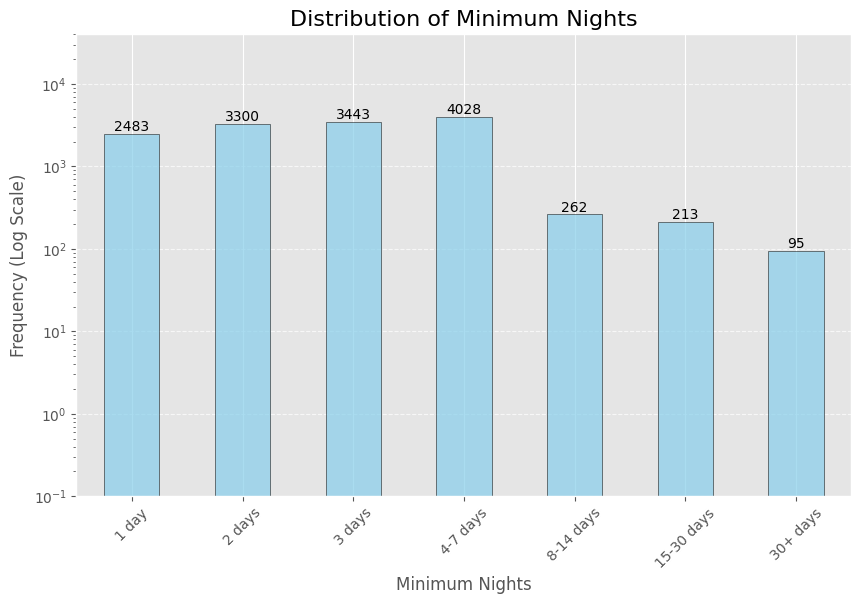

In [36]:
# Plotting minimum nights to a histogram with custom bins

bins = [1, 2, 3, 4, 8, 15, 31, 10000]
bin_labels = ['1 day', '2 days', '3 days', '4-7 days', '8-14 days', '15-30 days', "30+ days"]


listings_toClean['min_nights_binned'] = pd.cut(listings_toClean['minimum_nights'], bins=bins, labels=bin_labels, right=False)

bin_counts = listings_toClean['min_nights_binned'].value_counts(sort=False)


plt.figure(figsize=(10, 6))
bin_counts.plot(kind='bar', color='skyblue', edgecolor='black', alpha=0.7)
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.ylim(0.1, bin_counts.max() * 10)
plt.title('Distribution of Minimum Nights', fontsize=16)
plt.xlabel('Minimum Nights', fontsize=12)
plt.ylabel('Frequency (Log Scale)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability


for i, count in enumerate(bin_counts):
    plt.text(i, count + 0.1, str(count), ha='center', va='bottom', fontsize=10)


plt.show()


In [37]:
# Cutting minimum nights over 7 days
listings_toClean = listings_toClean[listings_toClean['minimum_nights'] <= 7]

### 1.3.11 Review scores

- there are ca. 2000 apartments that have no ratings (and have non-NaN price) + most of the ratings are good --> I would exclude that column as well

review_scores_rating
'NaN count': 2096
[4.85 4.91 4.78 4.83 4.74 4.8  4.9  4.94 4.68 4.79 4.71 4.93 5.   4.46
 4.73 4.62 4.86 4.67  nan 4.81 4.87 4.72 4.58 4.97 4.63 4.92 4.54 4.59
 4.88 4.6  4.55 4.82 4.84 4.76 4.48 4.77 4.89 4.65 4.64 4.66 4.44 4.57
 4.75 4.29 4.69 4.96 4.95 4.5  4.22 4.   4.33 4.47 4.7  4.43 4.61 4.56
 4.26 4.4  4.53 4.45 4.38 4.39 4.99 4.98 4.18 4.36 4.35 3.5  4.25 4.51
 4.16 4.28 4.52 4.42 4.08 4.32 4.41 3.25 3.67 4.31 4.49 4.27 3.89 4.37
 3.4  4.17 4.1  4.3  2.67 3.75 3.33 4.05 3.   4.2  4.07 4.19 4.24 4.11
 4.13 4.15 4.21 3.97 1.   3.88 4.23 3.86 4.34 2.   4.14 3.83 3.78 3.6
 3.91 3.77 3.99 3.17 3.45]


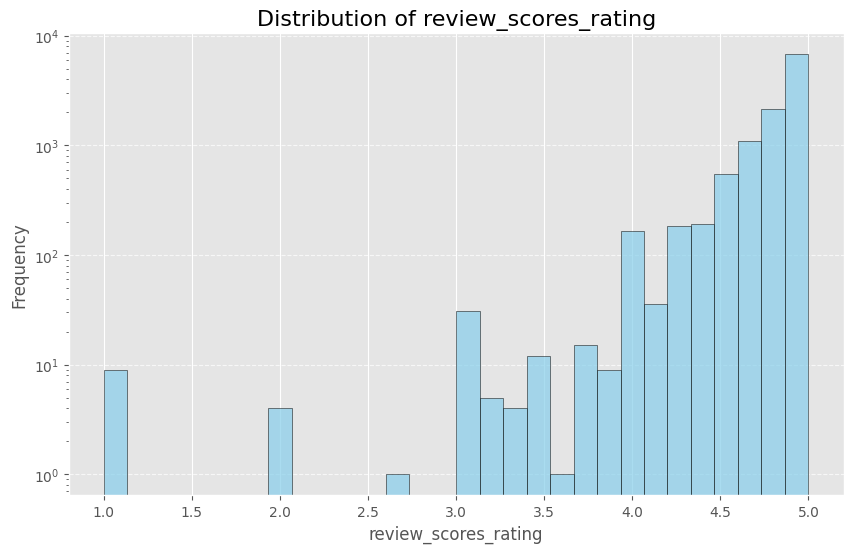

In [38]:
# Run basic checks + create histogram

distinct_review = listings_toClean['review_scores_rating'].unique()
nan_count_review = listings_toClean['review_scores_rating'].isna().sum()

print("review_scores_rating")
print(f"'NaN count': {nan_count_review}")
print(distinct_review)


plt.figure(figsize=(10, 6))
plt.hist(listings_toClean['review_scores_rating'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of review_scores_rating', fontsize=16)
plt.xlabel('review_scores_rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.yscale('log')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [39]:
# Export listings

listings_toClean.to_csv("./listings_cleaned_original.csv")

# 2. Clustering on original features

In this section, we applied a K-Means and a DBSCAN clustering algorithm directly on some features in the input data.

We later applied clustering algorithms to more advanced features, but it turned out that we were not able to create a better clustering with it, so we decided to use the simpler algorithm as the final result of this step.


We placed the complete process with some feature engineering into this separate section, so that it is easier to see the final solution we use in the project.

## 2.1. Filtering data for clustering

Taking the dataframe with the cleaned data, and filtering those columns that are needed for the "easy" k-means. The line with (id == 42501574) will be left out from the clustering, so that we can use that as a test in the end.

The info columns are the features that we don't use in the clustering. Latitude and longitude were omitted, because we used the neighbourhood as a geographic parameter. Amenities_count seemed to just add noise to the model. Bedrooms has a high correlation with accommodates, so we omitted that as well.

In [40]:
# Defining those columns that we want to use later

info_columns_kmeans = ['id', 'name', 'host_id', 'latitude', 'longitude', 'amenities_count', 'bedrooms']

scalable_columns_kmeans = [
    'price', 'accommodates',
    'bathrooms',
    'minimum_nights']

qualitative_columns_kmeans = ['room_type', 'neighbourhood_cleansed']
qualitative_short_kmeans = ['room', 'nbh']

# Select if we want to scale the one-hot encoded values or not
scale_one_hot_encoded = True


# Creating the cleaned dataframe for the clustering

columns_to_keep = info_columns_kmeans + scalable_columns_kmeans + qualitative_columns_kmeans

df_clean = pd.read_csv("./listings_cleaned_original.csv")
features_kmeans = df_clean[columns_to_keep].copy()
features_kmeans = features_kmeans.dropna()

# Define ID that will be left out
id_toLeaveOut = 42501574
idx_toLeaveOut = features_kmeans[features_kmeans['id'] == id_toLeaveOut].index

features_kmeans.head(5)


,id,name,host_id,latitude,longitude,amenities_count,bedrooms,price,accommodates,bathrooms,minimum_nights,room_type,neighbourhood_cleansed
0,29118,Best Location in Cool Istedgade,125230,55.670230,12.555040,29,1,900,2,1.0,7,Entire home/apt,Vesterbro-Kongens Enghave
1,32379,"155 m2 artist flat on Vesterbro, with 2 bathrooms",140105,55.672638,12.552493,43,2,2282,4,2.0,3,Entire home/apt,Vesterbro-Kongens Enghave
2,38499,0 min. from everything in Cph.,122489,55.684288,12.573019,36,2,2223,6,1.0,5,Entire home/apt,Indre By
3,39055,Stylish apartment in central Copenhagen,167511,55.665070,12.583150,37,2,1760,4,2.0,2,Entire home/apt,Amager Vest
4,65902,10 min. from city centre on bike,322300,55.707100,12.553860,10,1,470,2,1.0,3,Private room,Nrrebro


## 2.2. One-hot encoding of qualitative columns

Creating a column for each with 0-1 values

In [41]:
one_hot_kmeans = pd.get_dummies(
    features_kmeans[qualitative_columns_kmeans],
    prefix = qualitative_short_kmeans,
    drop_first=True
)

one_hot_kmeans = one_hot_kmeans.astype(int)

one_hot_kmeans.head(5)

,room_Hotel room,room_Private room,room_Shared room,nbh_Amager st,nbh_Bispebjerg,nbh_Brnshj-Husum,nbh_Frederiksberg,nbh_Indre By,nbh_Nrrebro,nbh_Valby,nbh_Vanlse,nbh_Vesterbro-Kongens Enghave,nbh_sterbro
0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0


## 2.3 Selecting and scaling numerical values

Pushing the values through a standard scaler for the clusterings.

In [42]:
scalable_kmeans = features_kmeans[scalable_columns_kmeans]

if scale_one_hot_encoded:
    scalable_kmeans = pd.concat([scalable_kmeans, one_hot_kmeans], axis=1)

scalable_kmeans.head(5)

,price,accommodates,bathrooms,minimum_nights,room_Hotel room,room_Private room,room_Shared room,nbh_Amager st,nbh_Bispebjerg,nbh_Brnshj-Husum,nbh_Frederiksberg,nbh_Indre By,nbh_Nrrebro,nbh_Valby,nbh_Vanlse,nbh_Vesterbro-Kongens Enghave,nbh_sterbro
0,900,2,1.0,7,0,0,0,0,0,0,0,0,0,0,0,1,0
1,2282,4,2.0,3,0,0,0,0,0,0,0,0,0,0,0,1,0
2,2223,6,1.0,5,0,0,0,0,0,0,0,1,0,0,0,0,0
3,1760,4,2.0,2,0,0,0,0,0,0,0,0,0,0,0,0,0
4,470,2,1.0,3,0,1,0,0,0,0,0,0,1,0,0,0,0


In [43]:
# Scale values that we decided to scale (all numericals + one-hot encoded if we want to)
scaler = StandardScaler()
scaled_kmeans = scaler.fit_transform(scalable_kmeans)

scaled_kmeans_df = pd.DataFrame(scaled_kmeans, columns=scalable_kmeans.columns, index=scalable_kmeans.index)


# Combine scaled numerical features if needed
if not scale_one_hot_encoded:
    combined_kmeans = pd.concat([scaled_kmeans_df, one_hot_kmeans], axis=1)
else:
    combined_kmeans = scaled_kmeans_df


# Doublecheck if the 2 dataframe have the same highest index (we can delete the previously set index)
print(features_kmeans.index.max())
print(combined_kmeans.index.max())

# Split the data into two: The listings for the clustering, and the apartment that should be clustered after
X_testListing = combined_kmeans.loc[idx_toLeaveOut].values
X_scaled_kmeans = combined_kmeans.drop(index=idx_toLeaveOut).values

# Doublecheck the lengths of the datasets
print(f"Length of X_scaled_kmeans: {len(X_scaled_kmeans)}")
print(f"Length of X_testListing: {len(X_testListing)}")

labels_kmeans = features_kmeans[features_kmeans["id"] != id_toLeaveOut][['id', 'latitude', 'longitude']].copy().reset_index(drop=True)
print(labels_kmeans.index.max())

# Creating separate variables for the DBSCAN
labels_dbscan = labels_kmeans.copy()
X_scaled_dbscan = X_scaled_kmeans

labels_kmeans.head(5)




13253
13253
Length of X_scaled_kmeans: 13253
Length of X_testListing: 1
13252


,id,latitude,longitude
0,29118,55.670230,12.555040
1,32379,55.672638,12.552493
2,38499,55.684288,12.573019
3,39055,55.665070,12.583150
4,65902,55.707100,12.553860


## 2.4. Check clustering tendency (Hopkins statistic)

Measures whether dataset has a non-random clustering tendency by comparing the distances between real data points to randomly generated datapoints, where 0.5 means points are randomly distributed and <0.5 indicates clustering. If the random points tend to be further away from the datapoints, H will be small (ie, clusters exist)

In [44]:
from pyclustertend import hopkins

#Hopkins statistic
H = hopkins(X_scaled_kmeans, X_scaled_kmeans.shape[0])
print(f"Hopkins statistic: {H:.3f}")

Hopkins statistic: 0.004


## 2.5. K-Means

First, we tried the K-Means algorithm for creating clusters. This proved to be significantly better than DBSCAN, so we choose this as our result.

### 2.5.1 Elbow method

Running elbow method to determine number of clusters (n = 15).

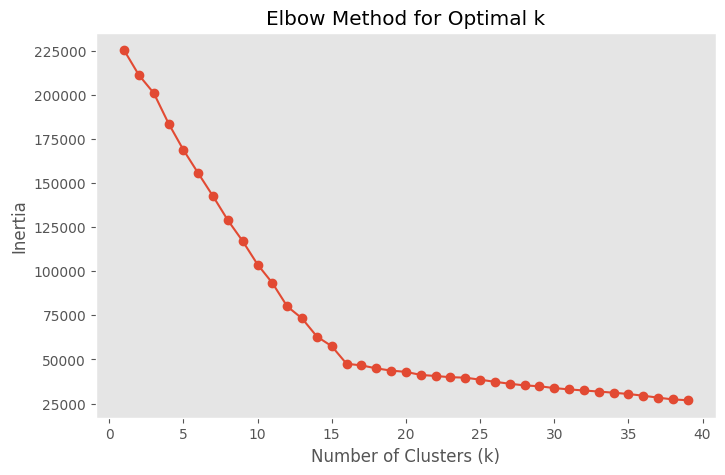

In [45]:
# Test a range of cluster numbers
inertia = []
K = range(1, 40)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_kmeans)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid()
plt.show()

### 2.5.2 Running K-Means

Silhouette Score: 0.481
Davies–Bouldin Index: 0.998
cluster_kmeans
3     2069
5     1959
2     1830
6     1279
12    1262
13    1064
1      944
0      772
9      656
7      562
4      502
10     331
14      16
8        4
11       3
Name: count, dtype: int64


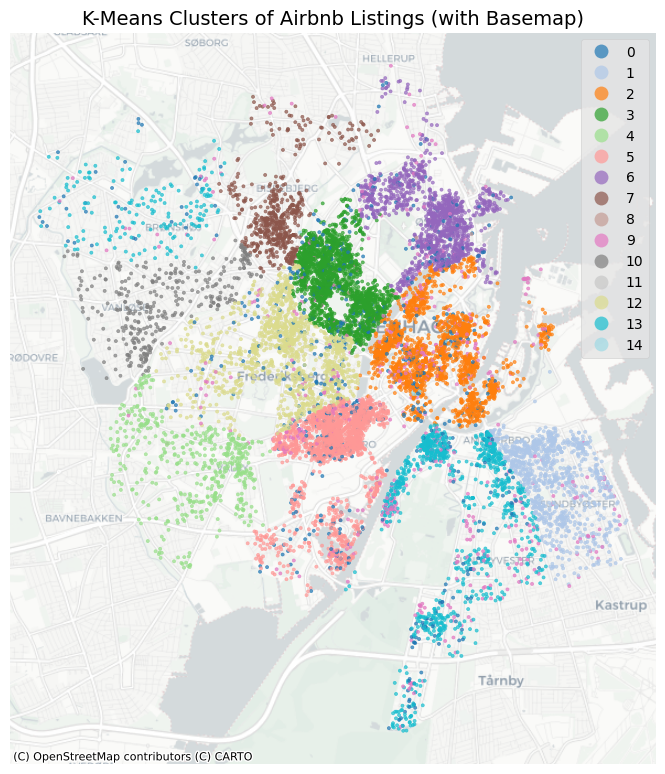

In [46]:
n_clusters = 15

# Initialize and fit the k-means model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans.fit(X_scaled_kmeans)

# Get the results
#print("Cluster centers:", kmeans.cluster_centers_)
labels = kmeans.labels_
# print("Labels for each point:", kmeans.labels_)

# Add cluster labels to your DataFrame
labels_kmeans['cluster_kmeans'] = labels

# Evaluate (if more than 1 cluster)
if n_clusters > 1:
    sil = silhouette_score(X_scaled_kmeans, labels)
    dbi = davies_bouldin_score(X_scaled_kmeans, labels)
    print(f"Silhouette Score: {sil:.3f}")
    print(f"Davies–Bouldin Index: {dbi:.3f}")


pd.set_option("display.max_rows", None)
print(labels_kmeans['cluster_kmeans'].value_counts())

#gdf
gdf = gpd.GeoDataFrame(
    labels_kmeans,
    geometry=gpd.points_from_xy(labels_kmeans.longitude, labels_kmeans.latitude),
    crs="EPSG:4326"  # WGS84 (lat/lon)
)
gdf = gdf.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(
    ax=ax,
    column='cluster_kmeans',
    categorical=True,
    cmap='tab20',  # Use a colormap with at least 15 unique colors
    markersize=5,
    alpha=0.7,
    legend=True
)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("K-Means Clusters of Airbnb Listings (with Basemap)", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### 2.5.3 Understanding clusters

There is basically a cluster for the average priced apartments in each neighbourhood, except for Amager-Vest and Bronshoj-Husum, which share a cluster. There is 1 cluster for the cheap and 1 for the expensive apartments. 

In [47]:
test_kmeans = labels_kmeans.merge(
    features_kmeans[['id', 'price', 'neighbourhood_cleansed']],
    on='id',
    how='left'
)

test_groups = test_kmeans.groupby(['cluster_kmeans', 'neighbourhood_cleansed']).agg({
    'price': 'mean',
    'id': 'count'
}).reset_index()


test_groups.rename(columns={'id': 'count'}, inplace=True)

test_groups_filtered = test_groups[test_groups['count'] > 20]

test_groups_filtered



,cluster_kmeans,neighbourhood_cleansed,price,count
0,0,Amager Vest,622.310924,119
1,0,Brnshj-Husum,519.176471,34
2,0,Frederiksberg,690.284314,102
3,0,Indre By,889.810219,137
4,0,Nrrebro,689.127820,133
5,0,Vesterbro-Kongens Enghave,624.457317,164
6,0,sterbro,798.530120,83
7,1,Amager st,1223.288136,944
8,2,Indre By,1912.598907,1830
9,3,Nrrebro,1203.680522,2069


In [48]:
# Filter for clusters that appear in more than 1 row
clusters_multiple = test_groups_filtered['cluster_kmeans'].value_counts()
clusters_keep = clusters_multiple[clusters_multiple > 1].index

test_groups_final = test_groups_filtered[test_groups_filtered['cluster_kmeans'].isin(clusters_keep)]


test_groups_final

,cluster_kmeans,neighbourhood_cleansed,price,count
0,0,Amager Vest,622.310924,119
1,0,Brnshj-Husum,519.176471,34
2,0,Frederiksberg,690.284314,102
3,0,Indre By,889.810219,137
4,0,Nrrebro,689.127820,133
5,0,Vesterbro-Kongens Enghave,624.457317,164
6,0,sterbro,798.530120,83
17,9,Amager Vest,2190.602339,171
18,9,Amager st,2637.000000,38
21,9,Frederiksberg,3248.111111,45


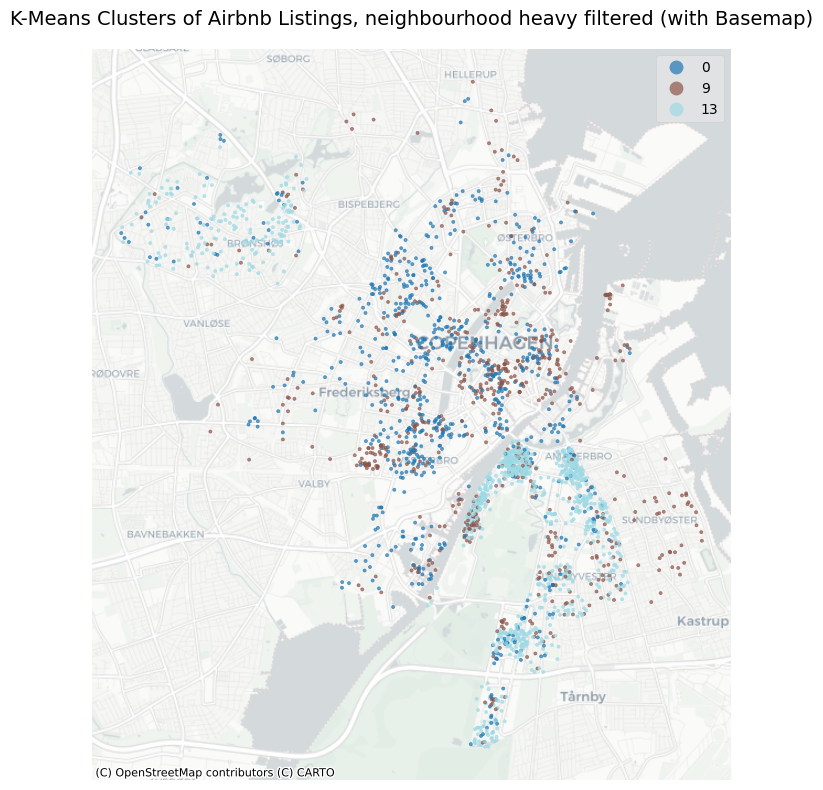

In [49]:
# Filter labels_kmeans for the kept clusters
labels_kmeans_filtered = labels_kmeans[labels_kmeans['cluster_kmeans'].isin(clusters_keep)]

#gdf
gdf = gpd.GeoDataFrame(
    labels_kmeans_filtered,
    geometry=gpd.points_from_xy(labels_kmeans_filtered.longitude, labels_kmeans_filtered.latitude),
    crs="EPSG:4326"  # WGS84 (lat/lon)
)
gdf = gdf.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(
    ax=ax,
    column='cluster_kmeans',
    categorical=True,
    cmap='tab20',  # Use a colormap with at least 15 unique colors
    markersize=5,
    alpha=0.7,
    legend=True
)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("K-Means Clusters of Airbnb Listings, neighbourhood heavy filtered (with Basemap)", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

### 2.5.4 Getting cluster for test listing

In [50]:
label_testListing = kmeans.predict(X_testListing)

print(label_testListing)

[2]


## 2.6 DBSCAN

We just present the results of the DBSCAN clustering.

### 2.6.1. Tuning DBSCAN with eps

18


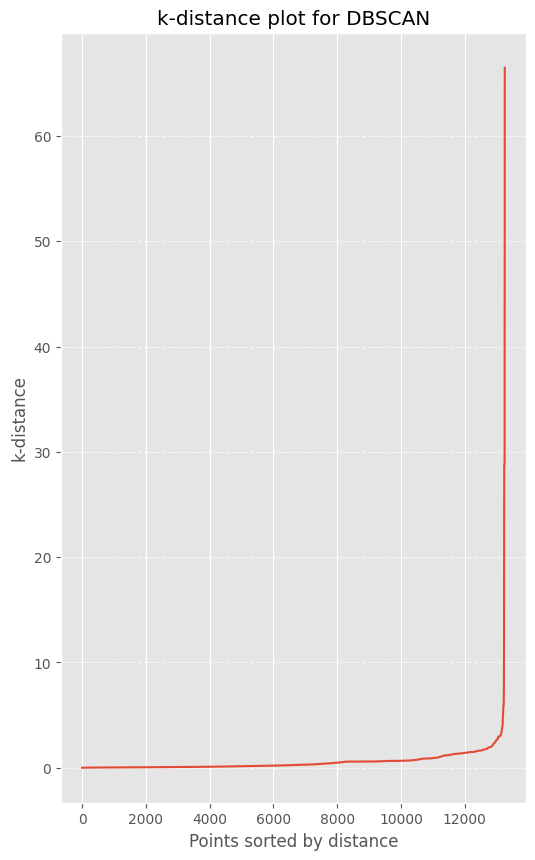

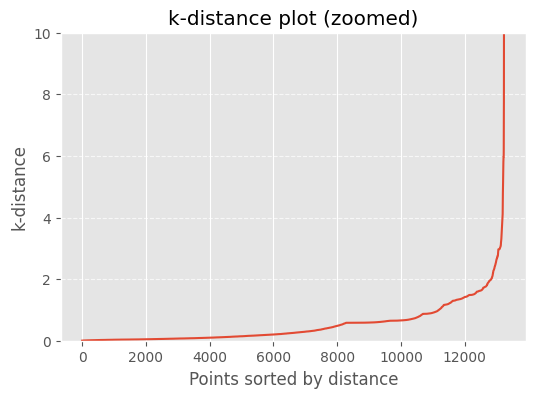

In [51]:
# k-distance plot
n = len(X_scaled_dbscan[1])+1
print(n)
neighbors = NearestNeighbors(n_neighbors=n)
neighbors_fit = neighbors.fit(X_scaled_dbscan)
distances, indices = neighbors_fit.kneighbors(X_scaled_dbscan)

k_distances = np.sort(distances[:, n-1])

plt.figure(figsize=(6, 10))
plt.plot(k_distances)
plt.title("k-distance plot for DBSCAN")
plt.xlabel("Points sorted by distance")
plt.ylabel("k-distance")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

#zoom
plt.figure(figsize=(6, 4))
plt.plot(k_distances)
plt.title("k-distance plot (zoomed)")
plt.xlabel("Points sorted by distance")
plt.ylabel("k-distance")
plt.ylim(0, 10)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

### 2.6.2. Running DBSCAN

Estimated number of clusters: 22
Noise points: 158
Silhouette Score: 0.460
Davies–Bouldin Index: 1.857


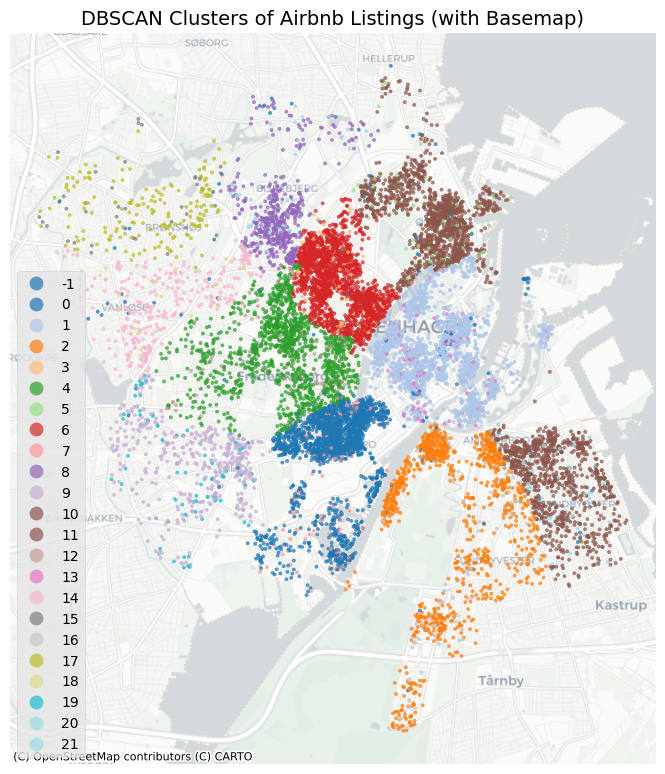

cluster_dbscan
-1      158
 0     2054
 1     1999
 2     1061
 3      130
 4     1295
 5       83
 6     2104
 7      163
 8      503
 9      430
 10    1305
 11     891
 12     103
 13     129
 14     284
 15      37
 16     113
 17     172
 18      36
 19      68
 20      81
 21      54
Name: id, dtype: int64

In [52]:
dbscan = DBSCAN(eps=1.9, min_samples=n)
labels = dbscan.fit_predict(X_scaled_dbscan)

# Add cluster labels to your DataFrame
labels_dbscan['cluster_dbscan'] = labels

# Check number of clusters (excluding noise)
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print(f"Estimated number of clusters: {n_clusters}")
print(f"Noise points: {n_noise}")

# Evaluate (if more than 1 cluster)
if n_clusters > 1:
    sil = silhouette_score(X_scaled_dbscan, labels)
    dbi = davies_bouldin_score(X_scaled_dbscan, labels)
    print(f"Silhouette Score: {sil:.3f}")
    print(f"Davies–Bouldin Index: {dbi:.3f}")
    
#gdf
gdf = gpd.GeoDataFrame(
    labels_dbscan,
    geometry=gpd.points_from_xy(labels_dbscan.longitude, labels_dbscan.latitude),
    crs="EPSG:4326"  # WGS84 (lat/lon)
)
gdf = gdf.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(
    ax=ax,
    column='cluster_dbscan',
    categorical=True,
    cmap='tab20',
    markersize=5,
    alpha=0.7,
    legend=True
)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("DBSCAN Clusters of Airbnb Listings (with Basemap)", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()


labels_dbscan[['id', 'cluster_dbscan']].groupby('cluster_dbscan')['id'].count()



## 2.7. Exporting results for further steps

We export the results to a listings_clustered.csv, that is read by the other notebook for further steps. We manually add the test listing to the end as cluster 100.

In [53]:
features_kmeans.head(5)

,id,name,host_id,latitude,longitude,amenities_count,bedrooms,price,accommodates,bathrooms,minimum_nights,room_type,neighbourhood_cleansed
0,29118,Best Location in Cool Istedgade,125230,55.670230,12.555040,29,1,900,2,1.0,7,Entire home/apt,Vesterbro-Kongens Enghave
1,32379,"155 m2 artist flat on Vesterbro, with 2 bathrooms",140105,55.672638,12.552493,43,2,2282,4,2.0,3,Entire home/apt,Vesterbro-Kongens Enghave
2,38499,0 min. from everything in Cph.,122489,55.684288,12.573019,36,2,2223,6,1.0,5,Entire home/apt,Indre By
3,39055,Stylish apartment in central Copenhagen,167511,55.665070,12.583150,37,2,1760,4,2.0,2,Entire home/apt,Amager Vest
4,65902,10 min. from city centre on bike,322300,55.707100,12.553860,10,1,470,2,1.0,3,Private room,Nrrebro


In [54]:
# Select the relevant columns
clusters_toExport = labels_kmeans[['id', 'cluster_kmeans']]

# Add a new row using pd.concat
new_row = pd.DataFrame({'id': [id_toLeaveOut], 'cluster_kmeans': 100})
clusters_toExport = pd.concat([clusters_toExport, new_row], ignore_index=True)

# Save the DataFrame to a CSV file
clusters_toExport.to_csv('listings_clustered.csv', index=False)

# 3. Feature Engineering

This part contains more advanced methods, which aim to create more useful data for the clustering.

## 3.1 Creating advanced features

In this part, we will use Gemini to create 2 more features based on the database, from which we hope to improve the quality of our clustering.

Due to the time-intensive nature of these codes, we provide the results of these steps as separate .csv/.jsonl files, and the code itself will be commented out.

### 3.1.1 Mapping amenities

- Amenities are stored in arrays inside the cells

- The labels are unfortunately not standardised and seem to be free entry. A majority of the amenities are eg tv size and the number can thus be significantly reduced by conflating them. Due to the large number of varaiables, we used an LLM to parse and categorise the amenities and added these overarchign high-level categories to the  dataframe.

- We also calculted the total number of amenities per listing.

- We create a histogram at the end, to check how the resulting column looks.

In [55]:
listings_toClean = pd.read_csv("./listings_cleaned_original.csv")
listings_toClean.head()

,Unnamed: 0,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,has_price,price_outlier,amenities_count,difference,min_nights_binned
0,0,29118,https://www.airbnb.com/rooms/29118,20250627030604,2025-06-30,city scrape,Best Location in Cool Istedgade,NaN,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,Nana,2010-05-15,"Copenhagen, Denmark",I have a Master of Arts in Musicology and I wo...,within a few hours,100%,50%,f,https://a0.muscache.com/im/users/125230/profil...,https://a0.muscache.com/im/users/125230/profil...,Vesterbro,1.0,1.0,"['email', 'phone']",t,t,NaN,Vesterbro-Kongens Enghave,NaN,55.670230,12.555040,Entire rental unit,Entire home/apt,2,1.0,1 bath,1,1.0,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...",900,7,14,5.0,5.0,14.0,14.0,5.0,14.0,NaN,t,6,7,17,18,2025-06-30,27,0,0,18,1,0,0.0,2010-06-17,2024-03-31,4.85,4.67,4.67,4.89,5.00,4.83,4.72,NaN,f,1,1,0,0,0.15,True,False,29,1.0,4-7 days
1,2,32379,https://www.airbnb.com/rooms/32379,20250627030604,2025-06-28,city scrape,"155 m2 artist flat on Vesterbro, with 2 bathrooms",You enter a narrow entrance and feel the good ...,"Værnedamsvej area is super hip area, we call i...",https://a0.muscache.com/pictures/miso/Hosting-...,140105,https://www.airbnb.com/users/show/140105,Lise,2010-06-07,"Copenhagen, Denmark",As profession - Set and Costumedesigner for Av...,within an hour,100%,100%,t,https://a0.muscache.com/im/users/140105/profil...,https://a0.muscache.com/im/users/140105/profil...,Vesterbro,3.0,4.0,"['email', 'phone']",t,t,"Copenhagen, V, Denmark",Vesterbro-Kongens Enghave,NaN,55.672638,12.552493,Entire rental unit,Entire home/apt,4,2.0,2 baths,2,3.0,"[""Dedicated workspace"", ""Hot water"", ""Iron"", ""...",2282,3,5,3.0,3.0,5.0,5.0,3.0,5.0,NaN,t,0,4,4,4,2025-06-28,85,3,1,4,3,18,41076.0,2010-08-23,2025-06-21,4.91,4.96,4.93,4.88,4.91,4.89,4.71,NaN,f,2,1,1,0,0.47,True,False,43,1.0,3 days
2,4,38499,https://www.airbnb.com/rooms/38499,20250627030604,2025-06-30,city scrape,0 min. from everything in Cph.,It doesn't get more central than this. Histori...,Area: <br />This is the eye of Cph. right betw...,https://a0.muscache.com/pictures/hosting/Hosti...,122489,https://www.airbnb.com/users/show/122489,Christina,2010-05-11,"Copenhagen, Denmark","We are...\nCarsten and Christina, and our 3 aw...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/5db78...,https://a0.muscache.com/im/pictures/user/5db78...,Indre By,1.0,4.0,"['email', 'phone']",t,t,"Copenhagen, Denmark",Indre By,NaN,55.684288,12.573019,Entire condo,Entire home/apt,6,1.0,1 bath,2,2.0,"[""Dedicated workspace"", ""Din

#### Instruction Gemini to map amenities

In [56]:
# #CONFIGURATION
# API_KEY = "x"
# listings = listings_toClean
# OUTPUT_CSV = "listings_amenities_cleaned.csv"
# MAP_FILE = "amenity_map.json"
# CHUNK_SIZE = 100  # Batches

# client = genai.Client(api_key=API_KEY)

# def parse_amenities_row(text):
#     # clean amenities text
#     if pd.isna(text):
#         return []
#     try:
#         return ast.literal_eval(text)
#     except Exception:
#         clean = text.replace('[', '').replace(']', '').replace('"', '').replace("'", "")
#         return [x.strip() for x in clean.split(',') if x.strip()]

# #Extract unique amenities
# all_raw = []
# for row in tqdm(listings['amenities'], desc="Collecting amenities"):
#     all_raw.extend(parse_amenities_row(row))

# unique_amenities = sorted(list(set(all_raw)))

# mapping_dict = {}

# def clean_json_response(text):
#     #Fixes common LLM JSON errors
#     text = re.sub(r'```json\s*', '', text)
#     text = re.sub(r'```\s*', '', text)
#     start = text.find('{')
#     end = text.rfind('}')
#     if start != -1 and end != -1:
#         return text[start:end+1]
#     return text

# total_batches = math.ceil(len(unique_amenities) / CHUNK_SIZE)

# #Batch mapping
# for i in tqdm(range(0, len(unique_amenities), CHUNK_SIZE),
#               total=total_batches,
#               desc="Mapping amenities with Gemini"):
#     batch_num = (i // CHUNK_SIZE) + 1
#     batch = unique_amenities[i:i+CHUNK_SIZE]

#     prompt = f"""
#     You are a strict data standardizer. Map these raw Airbnb amenities to standardized generic terms.

#     RULES:
#     1. REMOVE BRANDS & DETAILS: "Miele refrigerator" -> "Refrigerator". "50-inch Sony HDTV" -> "TV".
#     2. GENERALIZE: "Nespresso", "Keurig", "French Press" -> ALL become "Coffee Maker".
#     3. CATEGORIZE: Assign a high-level category (Kitchen, Tech, Bathroom, Comfort, Outdoor, Safety, Kids, Facilities, Services).

#     Return RAW JSON only. No markdown. No comments.
#     Format:
#     {{
#       "Original String": {{ "normalized": "Generic Name", "category": "High Level Category" }}
#     }}

#     Items: {json.dumps(batch)}
#     """

#     retries = 3
#     while retries > 0:
#         try:
#             response = client.models.generate_content(
#                 model="gemini-2.5-flash-lite",
#                 contents=prompt,
#                 config=types.GenerateContentConfig(response_mime_type="application/json")
#             )

#             clean_text = clean_json_response(response.text)
#             batch_map = json.loads(clean_text)
#             mapping_dict.update(batch_map)

#             break

#         except Exception as e:
#             print(f"Error on Batch {batch_num}: {e}. Retrying ({retries-1} left)...")
#             retries -= 1
#             time.sleep(2)

# #Save map
# with open("amenity_map.json", "w") as f:
#     json.dump(mapping_dict, f, indent=2)

# #Apply to dataset
# clean_col, cat_col = [], []

# for row_str in tqdm(listings['amenities'], desc="Applying amenity mapping"):
#     raw = parse_amenities_row(row_str)
#     row_norm, row_cat = [], []

#     for item in raw:
#         if item in mapping_dict:
#             entry = mapping_dict[item]
#             if isinstance(entry, dict):
#                 row_norm.append(entry.get('normalized', item))
#                 row_cat.append(entry.get('category', 'Uncategorized'))
#         else:
#             row_norm.append(item)
#             row_cat.append('Other')

#     clean_col.append(", ".join(sorted(list(set(row_norm)))))
#     cat_col.append(", ".join(sorted(list(set(row_cat)))))

# #add to df
# listings['amenities_clean'] = clean_col
# listings['amenities_category'] = cat_col

# listings_toClean.to_csv(OUTPUT_CSV)

# listings_toClean.head()

#### Plot the results

In [57]:
amenities_map = pd.read_csv("listings_amenities_cleaned.csv")
amenities_map = amenities_map[["id", "amenities_clean", "amenities_category"]]

#If we ran the previous section, we will already have it, so we drop it
try:
    listings_toClean = listings_toClean.drop(columns=["amenities_clean", "amenities_category"], axis = 1)
except:
    pass

listings_toClean = listings_toClean.merge(amenities_map, on="id", how="left")
listings_toClean.head()

,Unnamed: 0,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,has_price,price_outlier,amenities_count,difference,min_nights_binned,amenities_clean,amenities_category
0,0,29118,https://www.airbnb.com/rooms/29118,20250627030604,2025-06-30,city scrape,Best Location in Cool Istedgade,NaN,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,Nana,2010-05-15,"Copenhagen, Denmark",I have a Master of Arts in Musicology and I wo...,within a few hours,100%,50%,f,https://a0.muscache.com/im/users/125230/profil...,https://a0.muscache.com/im/users/125230/profil...,Vesterbro,1.0,1.0,"['email', 'phone']",t,t,NaN,Vesterbro-Kongens Enghave,NaN,55.670230,12.555040,Entire rental unit,Entire home/apt,2,1.0,1 bath,1,1.0,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...",900,7,14,5.0,5.0,14.0,14.0,5.0,14.0,NaN,t,6,7,17,18,2025-06-30,27,0,0,18,1,0,0.0,2010-06-17,2024-03-31,4.85,4.67,4.67,4.89,5.00,4.83,4.72,NaN,f,1,1,0,0,0.15,True,False,29,1.0,4-7 days,"Baby Bath, Backyard, Blackout Curtains, Blende...","Bathroom, Comfort, Facilities, Kids, Kitchen, ..."
1,2,32379,https://www.airbnb.com/rooms/32379,20250627030604,2025-06-28,city scrape,"155 m2 artist flat on Vesterbro, with 2 bathrooms",You enter a narrow entrance and feel the good ...,"Værnedamsvej area is super hip area, we call i...",https://a0.muscache.com/pictures/miso/Hosting-...,140105,https://www.airbnb.com/users/show/140105,Lise,2010-06-07,"Copenhagen, Denmark",As profession - Set and Costumedesigner for Av...,within an hour,100%,100%,t,https://a0.muscache.com/im/users/140105/profil...,https://a0.muscache.com/im/users/140105/profil...,Vesterbro,3.0,4.0,"['email', 'phone']",t,t,"Copenhagen, V, Denmark",Vesterbro-Kongens Enghave,NaN,55.672638,12.552493,Entire rental unit,Entire home/apt,4,2.0,2 baths,2,3.0,"[""Dedicated workspace"", ""Hot water"", ""Iron"", ""...",2282,3,5,3.0,3.0,5.0,5.0,3.0,5.0,NaN,t,0,4,4,4,2025-06-28,85,3,1,4,3,18,41076.0,2010-08-23,2025-06-21,4.91,4.96,4.93,4.88,4.91,4.89,4.71,NaN,f,2,1,1,0,0.47,True,False,43,1.0,3 days,"Bathtub, Bed Linens, Blackout Curtains, Books ...","Bathroom, Comfort, Facilities, Kids, Kitchen, ..."
2,4,38499,https://www.airbnb.com/rooms/38499,20250627030604,2025-06-30,city scrape,0 min. from everything in Cph.,It doesn't get more central than this. Histori...,Area: <br />This is the eye of Cph. right betw...,https://a0.muscache.com/pictures/hosting/Hosti...,122489,https://www.airbnb.com/users/show/122489,Christina,2010-05-11,"Copenhagen, Denmark","We are...\nCarsten and Christina, and our 3 aw...",within an hour,100%,100%,t,https://a0.muscache.com/im/picture

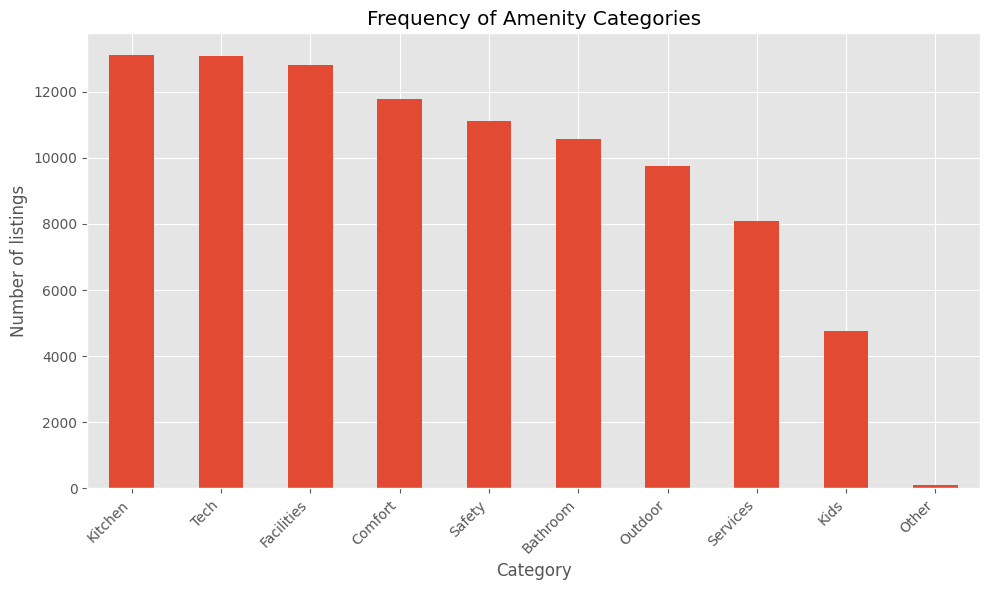

In [58]:
#plot distributions
cat_counts = (
    listings_toClean['amenities_category']
      .fillna('')
      .str.split(', ')
      .explode()
      .loc[lambda s: s.ne('')] # drop empty strings
      .value_counts()
)

plt.figure(figsize=(10, 6))
cat_counts.plot(kind='bar')
plt.title('Frequency of Amenity Categories')
plt.xlabel('Category')
plt.ylabel('Number of listings')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


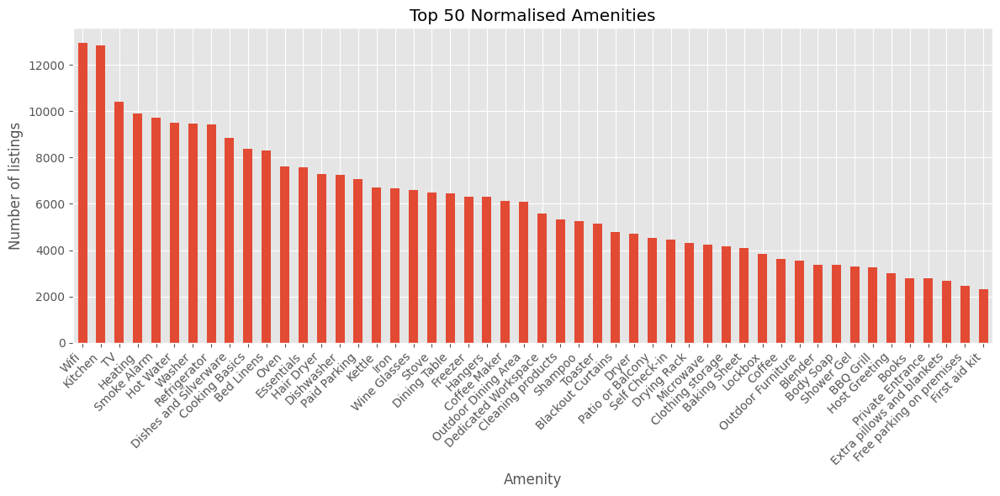

In [59]:
amen_counts = (
    listings_toClean['amenities_clean']
      .fillna('')
      .str.split(', ')
      .explode()
      .loc[lambda s: s.ne('')]
      .value_counts()
)

top_n = 50
plt.figure(figsize=(12, 6))
amen_counts.head(top_n).plot(kind='bar')
plt.title(f'Top {top_n} Normalised Amenities')
plt.xlabel('Amenity')
plt.ylabel('Number of listings')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### 3.1.2. Creating a hygge-score based on the images

Downloading the images stored from the URL in the Dataset, and finding a hygge-score for each apartment based on that.

#### Download images

In [60]:
# CSV_PATH = "listings.csv"          # your CSV file
# URL_COLUMN = "picture_url"         # which column to use
# ID_COLUMN = "id"                   # used for filenames
# OUTPUT_DIR = "./listings"          # where to save
# MAX_WORKERS = 50                   # number of parallel downloads
# TIMEOUT = 15                       # per-request timeout (seconds)


# def sanitize_filename(name: str) -> str:
#     """Remove/replace characters that are problematic in filenames."""
#     return re.sub(r'[^A-Za-z0-9_.-]+', "_", str(name))


# def guess_extension_from_url(url: str) -> str:
#     """Try to guess a file extension from the URL path. Default to .jpg."""
#     parsed = urlparse(url)
#     _, ext = os.path.splitext(parsed.path)
#     if ext and len(ext) <= 5:
#         return ext
#     return ".jpg"


# def download_one(row):
#     """Download a single image based on a row from the DataFrame."""
#     url = str(row[URL_COLUMN]).strip()
#     listing_id = row[ID_COLUMN]

#     if not url or url.lower() == "nan":
#         return False, url, "empty-url"

#     safe_id = sanitize_filename(listing_id)
#     ext = guess_extension_from_url(url)
#     out_dir = Path(OUTPUT_DIR)
#     out_dir.mkdir(parents=True, exist_ok=True)
#     out_path = out_dir / f"{safe_id}{ext}"

#     # Skip if already exists
#     if out_path.exists():
#         return True, url, "already-exists"

#     try:
#         resp = requests.get(url, timeout=TIMEOUT)
#         if resp.status_code != 200:
#             return False, url, f"status-{resp.status_code}"

#         with open(out_path, "wb") as f:
#             f.write(resp.content)

#         return True, url, "ok"
#     except Exception as e:
#         return False, url, str(e)


# def main():
#     df = pd.read_csv(CSV_PATH)

#     if URL_COLUMN not in df.columns:
#         raise ValueError(f"Column '{URL_COLUMN}' not found in {CSV_PATH}")
#     if ID_COLUMN not in df.columns:
#         raise ValueError(f"Column '{ID_COLUMN}' not found in {CSV_PATH}")

#     # Drop rows with missing URLs
#     df = df[df[URL_COLUMN].notna()]

#     successes = 0
#     failures = 0

#     with concurrent.futures.ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
#         futures = [executor.submit(download_one, row) for _, row in df.iterrows()]
#         total = len(futures)

#         for future in tqdm(
#             concurrent.futures.as_completed(futures),
#             total=total,
#             desc="Downloading images"
#         ):
#             ok, url, msg = future.result()
#             if ok:
#                 successes += 1
#             else:
#                 failures += 1
#                 tqdm.write(f"[FAIL] {url} -> {msg}")


# if __name__ == "__main__":
#     main()


#### Resize images

In [61]:
# #resize images to make more managageable
# ImageFile.LOAD_TRUNCATED_IMAGES = True  # Allow Pillow to load slightly broken images

# SRC_DIR = Path("./listings")
# OUT_DIR = Path("./listings_norm_small")
# OUT_DIR.mkdir(parents=True, exist_ok=True)

# TARGET_MAX = 384  # max side length in pixels
# MAX_WORKERS = 8   # tune this (8–16 is usually fine)

# img_paths = [p for p in SRC_DIR.glob("*") if p.is_file()]

# def process_one_image(img_path: Path):
#     """Resize a single image and save it to OUT_DIR. Returns (ok, img_path, error_msg_or_None)."""
#     try:
#         with Image.open(img_path) as im:
#             # Respect EXIF orientation
#             im = ImageOps.exif_transpose(im)
#             im = im.convert("RGB")
#             w, h = im.size

#             # Keep aspect ratio, no cropping
#             scale = TARGET_MAX / max(w, h)
#             new_size = (int(w * scale), int(h * scale))
#             im_resized = im.resize(new_size, Image.LANCZOS)

#             # Pad to square TARGET_MAX x TARGET_MAX
#             canvas = Image.new("RGB", (TARGET_MAX, TARGET_MAX), (0, 0, 0))
#             x = (TARGET_MAX - new_size[0]) // 2
#             y = (TARGET_MAX - new_size[1]) // 2
#             canvas.paste(im_resized, (x, y))

#             out_path = OUT_DIR / (img_path.stem + ".jpg")
#             canvas.save(out_path, format="JPEG", quality=85, optimize=True)

#         return True, img_path, None

#     except Exception as e:
#         return False, img_path, str(e)

# processed = 0
# skipped = 0

# with ThreadPoolExecutor(max_workers=MAX_WORKERS) as ex:
#     futures = {ex.submit(process_one_image, p): p for p in img_paths}

#     for fut in tqdm(as_completed(futures), total=len(futures), desc="Resizing images"):
#         ok, img_path, err = fut.result()
#         if ok:
#             processed += 1
#         else:
#             skipped += 1
#             tqdm.write(f"[SKIP] {img_path}: {err}")

#### Instruct Gemini to assign a hygge-score

In [62]:
# IMAGE_FOLDER = "./listings_norm_small"
# OUTPUT_FILE = "hygge_scores_split.jsonl"
# MAX_WORKERS = 50
# API_KEY = "x"

# client = genai.Client(api_key=API_KEY)

# SYSTEM_PROMPT = """
# Analyze this image.

# 1. **Hygge Index (0-100):** Rate the level of 'hygge' (Danish coziness) based on your internal understanding.
#    - Use the FULL scale (0-100).
#    - Center your scoring: 50 is a standard/average room.
#    - 0 is cold/sterile. 100 is the ultimate cozy sanctuary.
#    - Do not default to 70 or 75; be critical and nuanced.

# 2. **Extraction:**
#    - "elements": List physical objects and materials (e.g., "wood floor", "candle", "tv", "large window").
#    - "atmosphere": List adjectives describing the mood (e.g., "intimate", "sterile", "gloomy", "warm").

# Return strictly valid JSON:
# {
#   "hygge_score": <int 0-100>,
#   "elements": [<str>, <str>, ...],
#   "atmosphere": [<str>, <str>, ...]
# }
# """

# file_lock = threading.Lock()


# def process_one_image(filename: str) -> str:
#     file_path = os.path.join(IMAGE_FOLDER, filename)
#     try:
#         with open(file_path, "rb") as f:
#             image_bytes = f.read()

#         response = client.models.generate_content(
#             model="gemini-2.5-flash-lite",
#             contents=[
#                 types.Content(
#                     parts=[
#                         types.Part.from_bytes(
#                             data=image_bytes,
#                             mime_type="image/jpeg"
#                         ),
#                         types.Part.from_text(text=SYSTEM_PROMPT),
#                     ]
#                 )
#             ],
#             config=types.GenerateContentConfig(
#                 response_mime_type="application/json",
#                 temperature=0.4,
#             ),
#         )

#         data = json.loads(response.text)
#         data["filename"] = filename
#         return json.dumps(data)

#     except Exception as e:
#         return json.dumps({"filename": filename, "error": str(e)})


# def main():
#     if not os.path.exists(IMAGE_FOLDER):
#         raise FileNotFoundError(f"Folder not found: {IMAGE_FOLDER}")

#     all_files = [
#         f for f in os.listdir(IMAGE_FOLDER)
#         if f.lower().endswith((".jpg", ".jpeg", ".png"))
#     ]

#     processed_files = set()
#     if os.path.exists(OUTPUT_FILE):
#         with open(OUTPUT_FILE, "r") as f:
#             for line in f:
#                 try:
#                     processed_files.add(json.loads(line)["filename"])
#                 except Exception:
#                     pass

#     files_to_process = [f for f in all_files if f not in processed_files]

#     if not files_to_process:
#         return

#     with open(OUTPUT_FILE, "a") as f_out:
#         with ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
#             future_to_file = {
#                 executor.submit(process_one_image, fname): fname
#                 for fname in files_to_process
#             }

#             with tqdm(total=len(files_to_process), desc="Images", unit="img") as pbar:
#                 for future in as_completed(future_to_file):
#                     result = future.result()

#                     with file_lock:
#                         f_out.write(result + "\n")
#                         f_out.flush()

#                     pbar.update(1)


# if __name__ == "__main__":
#     main()


#### Save as csv

In [63]:
rows = []
with open("hygge_scores_split.jsonl", "r") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        d = json.loads(line)
        rows.append(d)

hygge_df = pd.DataFrame(rows)

hygge_df["id"] = hygge_df["filename"].str.extract(r"(\d+)", expand=False)
hygge_df["hygge_score"] = pd.to_numeric(hygge_df["hygge_score"], errors="coerce")
hygge_df = hygge_df[["id", "hygge_score", "elements", "atmosphere"]]
hygge_df["id"] = hygge_df["id"].astype("Int64")
listings_with_hygge = listings_toClean.merge(hygge_df, on="id", how="left")
listings_with_hygge.head()

,Unnamed: 0,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,has_price,price_outlier,amenities_count,difference,min_nights_binned,amenities_clean,amenities_category,hygge_score,elements,atmosphere
0,0,29118,https://www.airbnb.com/rooms/29118,20250627030604,2025-06-30,city scrape,Best Location in Cool Istedgade,NaN,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,Nana,2010-05-15,"Copenhagen, Denmark",I have a Master of Arts in Musicology and I wo...,within a few hours,100%,50%,f,https://a0.muscache.com/im/users/125230/profil...,https://a0.muscache.com/im/users/125230/profil...,Vesterbro,1.0,1.0,"['email', 'phone']",t,t,NaN,Vesterbro-Kongens Enghave,NaN,55.670230,12.555040,Entire rental unit,Entire home/apt,2,1.0,1 bath,1,1.0,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...",900,7,14,5.0,5.0,14.0,14.0,5.0,14.0,NaN,t,6,7,17,18,2025-06-30,27,0,0,18,1,0,0.0,2010-06-17,2024-03-31,4.85,4.67,4.67,4.89,5.00,4.83,4.72,NaN,f,1,1,0,0,0.15,True,False,29,1.0,4-7 days,"Baby Bath, Backyard, Blackout Curtains, Blende...","Bathroom, Comfort, Facilities, Kids, Kitchen, ...",70.0,"[wood floor, dining table, chairs, bench seati...","[warm, inviting, lived-in, functional, domesti..."
1,2,32379,https://www.airbnb.com/rooms/32379,20250627030604,2025-06-28,city scrape,"155 m2 artist flat on Vesterbro, with 2 bathrooms",You enter a narrow entrance and feel the good ...,"Værnedamsvej area is super hip area, we call i...",https://a0.muscache.com/pictures/miso/Hosting-...,140105,https://www.airbnb.com/users/show/140105,Lise,2010-06-07,"Copenhagen, Denmark",As profession - Set and Costumedesigner for Av...,within an hour,100%,100%,t,https://a0.muscache.com/im/users/140105/profil...,https://a0.muscache.com/im/users/140105/profil...,Vesterbro,3.0,4.0,"['email', 'phone']",t,t,"Copenhagen, V, Denmark",Vesterbro-Kongens Enghave,NaN,55.672638,12.552493,Entire rental unit,Entire home/apt,4,2.0,2 baths,2,3.0,"[""Dedicated workspace"", ""Hot water"", ""Iron"", ""...",2282,3,5,3.0,3.0,5.0,5.0,3.0,5.0,NaN,t,0,4,4,4,2025-06-28,85,3,1,4,3,18,41076.0,2010-08-23,2025-06-21,4.91,4.96,4.93,4.88,4.91,4.89,4.71,NaN,f,2,1,1,0,0.47,True,False,43,1.0,3 days,"Bathtub, Bed Linens, Blackout Curtains, Books ...","Bathroom, Comfort, Facilities, Kids, Kitchen, ...",65.0,"[sofa, armchair, coffee table, tray, pillows, ...","[cozy, inviting, lived-in, bright, personal]"
2,4,38499,https://www.airbnb.com/rooms/38499,20250627030604,2025-06-30,city scrape,0 min. from everything in Cph.,It doesn't get more central than this. Histori...,Area: <br />This is the eye of Cph. right betw...,https://a

In [64]:
listings_with_hygge.to_csv("./listings_cleaned_hygge.csv")# df_clean = listings_with_hygge.copy()

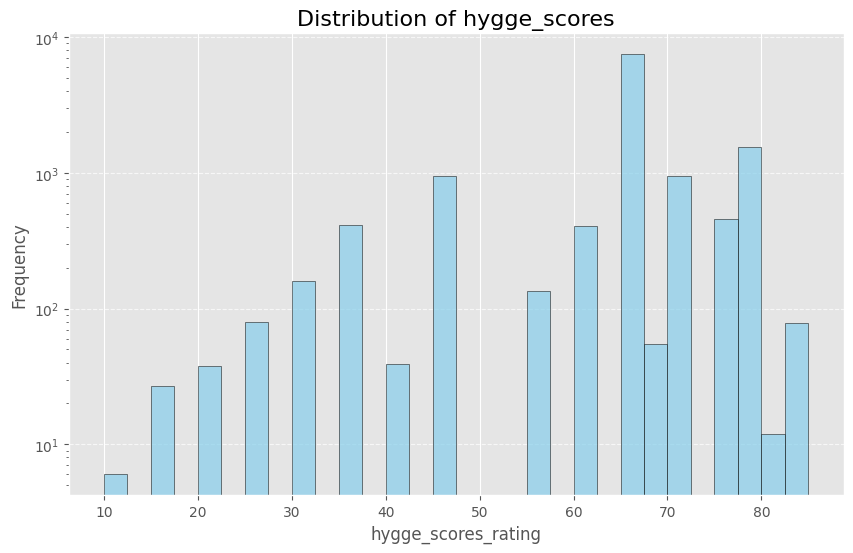

In [65]:
df_clean = pd.read_csv("./listings_cleaned_hygge.csv")

plt.figure(figsize=(10, 6))
plt.hist(df_clean['hygge_score'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of hygge_scores', fontsize=16)
plt.xlabel('hygge_scores_rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.yscale('log')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## 3.3. Selecting features

### 3.3.1 Correlation analysis

In [66]:
df = pd.read_csv("./listings_cleaned_hygge.csv")
df.head()

,Unnamed: 0.1,Unnamed: 0,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,has_price,price_outlier,amenities_count,difference,min_nights_binned,amenities_clean,amenities_category,hygge_score,elements,atmosphere
0,0,0,29118,https://www.airbnb.com/rooms/29118,20250627030604,2025-06-30,city scrape,Best Location in Cool Istedgade,NaN,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,Nana,2010-05-15,"Copenhagen, Denmark",I have a Master of Arts in Musicology and I wo...,within a few hours,100%,50%,f,https://a0.muscache.com/im/users/125230/profil...,https://a0.muscache.com/im/users/125230/profil...,Vesterbro,1.0,1.0,"['email', 'phone']",t,t,NaN,Vesterbro-Kongens Enghave,NaN,55.670230,12.555040,Entire rental unit,Entire home/apt,2,1.0,1 bath,1,1.0,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...",900,7,14,5.0,5.0,14.0,14.0,5.0,14.0,NaN,t,6,7,17,18,2025-06-30,27,0,0,18,1,0,0.0,2010-06-17,2024-03-31,4.85,4.67,4.67,4.89,5.00,4.83,4.72,NaN,f,1,1,0,0,0.15,True,False,29,1.0,4-7 days,"Baby Bath, Backyard, Blackout Curtains, Blende...","Bathroom, Comfort, Facilities, Kids, Kitchen, ...",70.0,"['wood floor', 'dining table', 'chairs', 'benc...","['warm', 'inviting', 'lived-in', 'functional',..."
1,1,2,32379,https://www.airbnb.com/rooms/32379,20250627030604,2025-06-28,city scrape,"155 m2 artist flat on Vesterbro, with 2 bathrooms",You enter a narrow entrance and feel the good ...,"Værnedamsvej area is super hip area, we call i...",https://a0.muscache.com/pictures/miso/Hosting-...,140105,https://www.airbnb.com/users/show/140105,Lise,2010-06-07,"Copenhagen, Denmark",As profession - Set and Costumedesigner for Av...,within an hour,100%,100%,t,https://a0.muscache.com/im/users/140105/profil...,https://a0.muscache.com/im/users/140105/profil...,Vesterbro,3.0,4.0,"['email', 'phone']",t,t,"Copenhagen, V, Denmark",Vesterbro-Kongens Enghave,NaN,55.672638,12.552493,Entire rental unit,Entire home/apt,4,2.0,2 baths,2,3.0,"[""Dedicated workspace"", ""Hot water"", ""Iron"", ""...",2282,3,5,3.0,3.0,5.0,5.0,3.0,5.0,NaN,t,0,4,4,4,2025-06-28,85,3,1,4,3,18,41076.0,2010-08-23,2025-06-21,4.91,4.96,4.93,4.88,4.91,4.89,4.71,NaN,f,2,1,1,0,0.47,True,False,43,1.0,3 days,"Bathtub, Bed Linens, Blackout Curtains, Books ...","Bathroom, Comfort, Facilities, Kids, Kitchen, ...",65.0,"['sofa', 'armchair', 'coffee table', 'tray', '...","['cozy', 'inviting', 'lived-in', 'bright', 'pe..."
2,2,4,38499,https://www.airbnb.com/rooms/38499,20250627030604,2025-06-30,city scrape,0 min. from everything in Cph.,It doesn't get more central than this. Histori...,Area: <br />This is the eye of Cph.

In [67]:
# correlation matrix on numeric cols only
num_df = df.select_dtypes(include='number')
corr = num_df.corr()
corr

,Unnamed: 0.1,Unnamed: 0,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,amenities_count,difference,hygge_score
Unnamed: 0.1,1.000000,0.992451,0.955797,NaN,0.372651,0.024757,0.003289,NaN,0.009571,-0.021361,-0.096568,-0.065726,-0.130889,-0.146160,-0.034143,-0.149521,-0.147509,-0.109647,-0.019026,-0.190286,-0.189333,-0.029652,-0.191842,NaN,0.050090,0.047721,0.047675,0.076432,-0.321298,-0.087692,-0.014628,0.047607,-0.187819,-0.175268,-0.120010,0.014380,-0.015255,0.020721,-0.044476,-0.032006,0.000314,0.015098,NaN,0.011418,0.011580,-0.007718,0.008456,0.187024,-0.285154,0.018055,0.007226
Unnamed: 0,0.992451,1.000000,0.969328,NaN,0.383191,0.027934,0.005652,NaN,0.009103,-0.021482,-0.102014,-0.069623,-0.140211,-0.157945,-0.035000,-0.152024,-0.152568,-0.110913,-0.021643,-0.194862,-0.193734,-0.031960,-0.196424,NaN,0.047913,0.047598,0.049893,0.075166,-0.331026,-0.075664,-0.010611,0.053181,-0.170183,-0.154621,-0.105060,0.016334,-0.015072,0.018838,-0.048677,-0.034109,0.003123,0.012653,NaN,0.012509,0.012720,-0.009296,0.007906,0.175971,-0.271679,0.023075,0.012148
id,0.955797,0.969328,1.000000,NaN,0.367587,0.026061,0.001903,NaN,0.013204,-0.024575,-0.093081,-0.064207,-0.125189,-0.152589,-0.034068,-0.140091,-0.157530,-0.102491,-0.022497,-0.200966,-0.202799,-0.029935,-0.204272,NaN,0.040024,0.039039,0.042443,0.074670,-0.328365,-0.076309,-0.018807,0.051657,-0.168230,-0.149497,-0.102142,0.018515,-0.015451,0.022142,-0.049051,-0.032136,-0.000775,0.013106,NaN,0.004722,0.005205,-0.017502,0.000590,0.155114,-0.259046,0.030683,0.016038
scrape_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
host_id,0.372651,0.383191,0.367587,NaN,1.000000,0.094472,0.051108,NaN,-0.010747,0.032727,-0.055637,-0.077997,-0.102464,-0.085430,0.008237,-0.179801,0.003316,-0.125346,-0.016591,-0.003508,0.002842,-0.020268,0.001265,NaN,0.053129,0.088902,0.104708,0.126789,-0.074251,0.056279,0.064361,0.115779,0.022641,0.033012,0.053143,-0.118202,-0.121120,-0.082714,-0.122750,-0.131978,-0.051805,-0.101622,NaN,0.070721,0.069932,0.027301,0.019022,0.174297,-0.127571,0.011803,-0.060640
host_listings_count,0.024757,0.027934,0.026061,NaN,0.094472,1.000000,0.953767,NaN,-0.008108,0.075026,0.056472,-0.013978,0.044318,0.060161,0.147901,-0.170635,0.334523,-0.119295,-0.021956,-0.009649,0.238672,-0.034442,0.124052,NaN,-0.088825,-0.078915,-0.069631,0.039545,-0.026236,-0.017404,-0.059918,-0.063732,-0.015322,-0.040708,0.013842,-0.150555,-0.143413,-0.077008,-0.144209,-0.161765,-0.036383,-0.146720,NaN,0.806907,0.805794,0.068117,0.008561,-0.012030,-0.067541,0.017904,-0.007191
host_total_listings_count,0.003289,0.005652,0.001903,NaN,0.051108,0.953767,1.000000,NaN,-0.000427,0.073066,0.051177,-0.010177,0.045956,0.063154,0.138332,-0.180753,0.352281,-0.127004,-0.020794,-0.063458,0.245661,-0.034473,0.101988,NaN,-0.082937,-0.077720,-0.072428,0.055079,-0.029073,-0.024506,-0.063854,-0.071013,-0.022016,-0.049579,0.000940,-0.097636,-0.096448,-0.050175,-0.090717,-0.096800,-0.004881,-0.107963,NaN,0.893145,0.893556,0.01

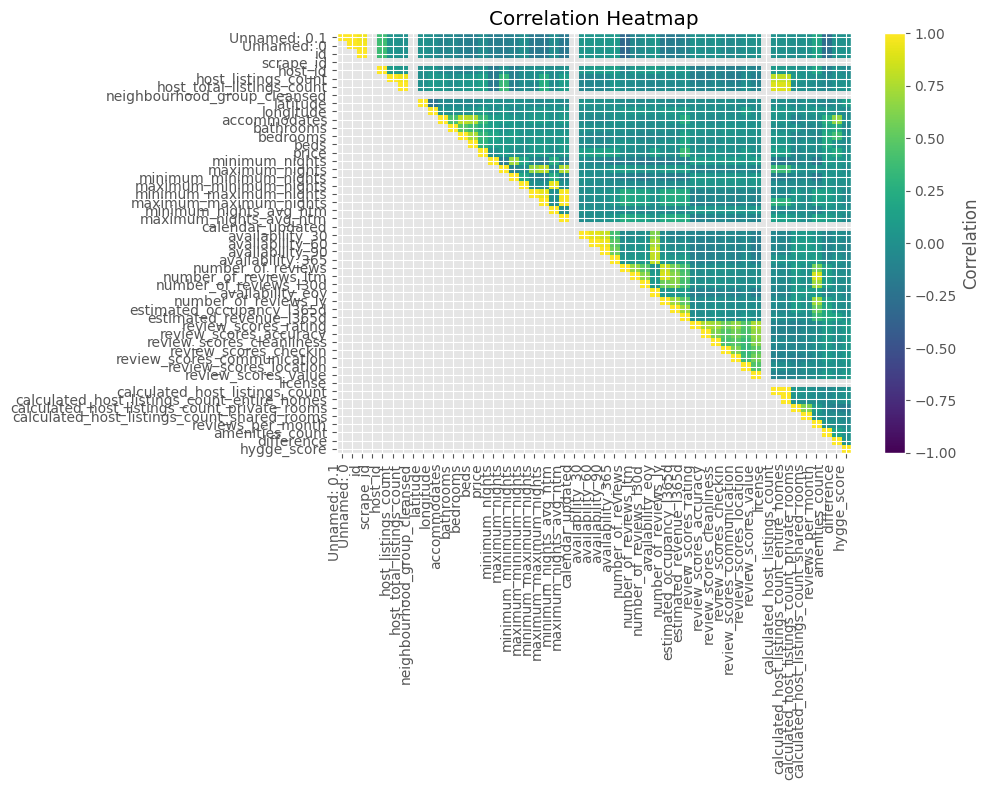

In [68]:
#plot heatmap
mask = np.tril(np.ones_like(corr, dtype=bool), k=-1)
corr_masked = np.ma.array(corr.values, mask=mask)

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(corr_masked, aspect="auto", vmin=-1, vmax=1)
ax.set_xticks(np.arange(len(corr.columns)))
ax.set_yticks(np.arange(len(corr.columns)))
ax.set_xticklabels(corr.columns, rotation=90, ha="right")
ax.set_yticklabels(corr.columns)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Correlation", rotation=90)

ax.set_title("Correlation Heatmap")
plt.tight_layout()
plt.show()

### 3.3.2. Encoding of qualitative columns

In [69]:
# Defining those columns that we want to use later
info_columns = ['id', 'latitude', 'longitude']
scalable_columns = ['price', 'accommodates', 'minimum_nights', 'amenities_count', 'hygge_score']
qualitative_columns = ['room_type', 'amenities', 'elements', 'atmosphere', 'neighbourhood_cleansed']

# Select if we want to scale the one-hot encoded values or not
scale_one_hot_encoded = True

# Creating the cleaned dataframe for the clustering
columns_to_keep = info_columns + scalable_columns + qualitative_columns
features_df = df[columns_to_keep].copy().dropna()
features_df = features_df.set_index('id')
features_df.head()

,latitude,longitude,price,accommodates,minimum_nights,amenities_count,hygge_score,room_type,amenities,elements,atmosphere,neighbourhood_cleansed
id,,,,,,,,,,,,
29118,55.670230,12.555040,900,2,7,29,70.0,Entire home/apt,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...","['wood floor', 'dining table', 'chairs', 'benc...","['warm', 'inviting', 'lived-in', 'functional',...",Vesterbro-Kongens Enghave
32379,55.672638,12.552493,2282,4,3,43,65.0,Entire home/apt,"[""Dedicated workspace"", ""Hot water"", ""Iron"", ""...","['sofa', 'armchair', 'coffee table', 'tray', '...","['cozy', 'inviting', 'lived-in', 'bright', 'pe...",Vesterbro-Kongens Enghave
38499,55.684288,12.573019,2223,6,5,36,65.0,Entire home/apt,"[""Dedicated workspace"", ""Dining table"", ""Lockb...","['round dining table', 'dining chairs', 'penda...","['warm', 'inviting', 'natural', 'rustic', 'liv...",Indre By
39055,55.665070,12.583150,1760,4,2,37,65.0,Entire home/apt,"[""Freezer"", ""Hot water"", ""Iron"", ""Room-darkeni...","['sectional sofa', 'l-shaped sofa', 'chaise lo...","['calm', 'bright', 'airy', 'comfortable', 'inv...",Amager Vest
65902,55.707100,12.553860,470,2,3,10,72.0,Private room,"[""Heating"", ""Wifi"", ""Dishes and silverware"", ""...","['wood floor', 'armchair', 'ottoman', 'desk', ...","['cozy', 'warm', 'inviting', 'calm', 'natural ...",Nrrebro


In [70]:
#==one-hot encode room_type & neighbourhood==
room_dummies = pd.get_dummies(features_df["room_type"], prefix="room", drop_first=False, dtype=int)
neigh_dummies = pd.get_dummies(features_df["neighbourhood_cleansed"], prefix="neigh", drop_first=False, dtype=int)
room_dummies.head()

,room_Entire home/apt,room_Hotel room,room_Private room,room_Shared room
id,,,,
29118,1,0,0,0
32379,1,0,0,0
38499,1,0,0,0
39055,1,0,0,0
65902,0,0,1,0


In [71]:
def parse_str_list(x):
    if pd.isna(x):
        return []
    if isinstance(x, list):
        return x
    try:
        return ast.literal_eval(x)
    except (ValueError, SyntaxError):
        # fallback: very crude comma split
        s = str(x).strip("[]\"'")
        return [t.strip().strip("'\"") for t in s.split(",") if t.strip()]

def multilabelbin(df, col, min_count=30):
    mlb = MultiLabelBinarizer()

    series = df[col].apply(parse_str_list)

    mat = mlb.fit_transform(series)
    out = pd.DataFrame(
        mat,
        index=df.index,
        columns=[f"{col}_{c}" for c in mlb.classes_]
    )

    # drop rare labels
    out = out.loc[:, out.sum() >= min_count]
    return out

elem_df = multilabelbin(features_df, "elements")
atmo_df = multilabelbin(features_df, "atmosphere")
amen_df = multilabelbin(features_df, "amenities")

print(f"Elements features kept:   {elem_df.shape[1]}")
print(f"Atmosphere features kept: {atmo_df.shape[1]}")
print(f"Amenities features kept:  {amen_df.shape[1]}")


Elements features kept:   412
Atmosphere features kept: 92
Amenities features kept:  278


In [72]:
amen_df.head()

,amenities_55 inch HDTV,amenities_Air conditioning,amenities_Arcade games,amenities_B&O Bluetooth sound system,amenities_BBQ grill,amenities_BBQ grill: charcoal,amenities_BBQ grill: gas,amenities_Baby bath,amenities_Baby bath - always at the listing,amenities_Baby bath - available upon request,amenities_Baby monitor,amenities_Baby monitor - available upon request,amenities_Baby safety gates,amenities_Babysitter recommendations,amenities_Backyard,amenities_Backyard - Fully fenced,amenities_Baking sheet,amenities_Barbecue utensils,amenities_Bathtub,amenities_Bay view,amenities_Beach access – Beachfront,amenities_Beach essentials,amenities_Beach view,amenities_Bed linens,amenities_Bidet,amenities_Bikes,amenities_Blender,amenities_Bluetooth sound system,amenities_Board games,amenities_Boat slip,amenities_Body soap,amenities_Books and reading material,amenities_Bosch refrigerator,amenities_Bread maker,amenities_Breakfast,amenities_Building staff,amenities_Canal view,amenities_Carbon monoxide alarm,amenities_Ceiling fan,amenities_Central air conditioning,amenities_Central heating,amenities_Changing table,amenities_Changing table - always at the listing,amenities_Changing table - available upon request,amenities_Children's playroom,amenities_Children’s bikes,amenities_Children’s books and toys,amenities_Children’s books and toys for ages 0-2 years old,amenities_Children’s books and toys for ages 0-2 years old and 2-5 years old,"amenities_Children’s books and toys for ages 0-2 years old, 2-5 years old, 5-10 years old, and 10+ years old","amenities_Children’s books and toys for ages 0-2 years old, 2-5 years old, and 5-10 years old",amenities_Children’s books and toys for ages 2-5 years old,amenities_Children’s books and toys for ages 2-5 years old and 5-10 years old,"amenities_Children’s books and toys for ages 2-5 years old, 5-10 years old, and 10+ years old",amenities_Children’s books and toys for ages 5-10 years old,amenities_Children’s dinnerware,amenities_City skyline view,amenities_Cleaning available during stay,amenities_Cleaning products,amenities_Climbing wall,amenities_Clothing storage,amenities_Clothing storage: closet,amenities_Clothing storage: closet and dresser,amenities_Clothing storage: closet and wardrobe,"amenities_Clothing storage: closet, wardrobe, and dresser",amenities_Clothing storage: dresser,amenities_Clothing storage: walk-in closet,amenities_Clothing storage: wardrobe,amenities_Clothing storage: wardrobe and dresser,amenities_Coffee,amenities_Coffee maker,amenities_Coffee maker: Nespresso,"amenities_Coffee maker: Nespresso, pour-over coffee",amenities_Coffee maker: drip coffee maker,"amenities_Coffee maker: drip coffee maker, espresso machine","amenities_Coffee maker: drip coffee maker, french press","amenities_Coffee maker: drip coffee maker, french press, pour-over coffee","amenities_Coffee maker: drip coffee maker, pour-over coffee",amenities_Coffee maker: espresso machine,"amenities_Coffee maker: espresso machine, Nespresso","amenities_Coffee maker: espresso machine, french press",amenities_Coffee maker: french press,"amenities_Coffee maker: french press, Nespresso","amenities_Coffee maker: french press, pour-over coffee",amenities_Coffee maker: pour-over coffee,amenities_Conditioner,amenities_Cooking basics,amenities_Courtyard view,amenities_Crib,amenities_Crib - always at the listing,amenities_Crib - available upon request,amenities_Dedicated workspace,amenities_Dining table,amenities_Dishes and silverware,amenities_Dishwasher,amenities_Double oven,amenities_Dryer,amenities_Dryer – In building,amenities_Dryer – In unit,amenities_Drying rack for clothing,amenities_EV charger,amenities_EV charger - level 1,amenities_EV charger - level 2,amenities_Electric stove,amenities_Elevator,amenities_Essentials,amenities_Ethernet connection,amenities_Exercise equipment,amenities_Exercise equipment: free weights,"amenities_Exercise equipment: free weights, yoga mat",amenities_Exercise equipment: yoga mat,amenities_E

### 3.3.3. PCA

In [73]:
#==pca==
def run_pca(matrix, n_pcs=10, random_state=42): #5 PCs keeps about 20% of variability in each
    #handle df or np.array
    if hasattr(matrix, "values"):
        X = matrix.values
    else:
        X = np.asarray(matrix)
    #run pca
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    pca_model = PCA(n_components=n_pcs, random_state=random_state)
    X_pca = pca_model.fit_transform(X_scaled)
    return X_pca, pca_model

#hygge pca
# hygge pca
hygge_matrix = pd.concat([elem_df, atmo_df], axis=1).fillna(0)
hygge_pca, hygge_pca_model = run_pca(hygge_matrix, n_pcs=100)
print("Explained variance (hygge PCs):", hygge_pca_model.explained_variance_ratio_)
hygge_pca_cols = [f"hygge_pca_{i}" for i in range(hygge_pca.shape[1])]
hygge_pca_df = pd.DataFrame(hygge_pca, index=hygge_matrix.index, columns=hygge_pca_cols)
features_df = features_df.join(hygge_pca_df)

#amenities pca
# amenities pca
amen_matrix = amen_df.fillna(0)
amen_pca, amen_pca_model = run_pca(amen_matrix, n_pcs=100)
print("Explained variance (amenities PCs):", amen_pca_model.explained_variance_ratio_)
amen_pca_cols = [f"amen_pca_{i}" for i in range(amen_pca.shape[1])]
amen_pca_df = pd.DataFrame(amen_pca, index=amen_matrix.index, columns=amen_pca_cols)
features_df = features_df.join(amen_pca_df)

Explained variance (hygge PCs): [0.01851748 0.01198129 0.00942206 0.008964   0.00739343 0.00690038
 0.00602915 0.00553765 0.00541853 0.00535573 0.00488026 0.00469422
 0.00434746 0.00421693 0.00401907 0.00393175 0.00386177 0.00376997
 0.00368226 0.00363322 0.00358129 0.0035483  0.00347701 0.00342021
 0.00338512 0.00336399 0.00331933 0.00329093 0.00325057 0.00321421
 0.00317497 0.00314988 0.00309567 0.00305538 0.00301922 0.00299915
 0.00294707 0.00294078 0.00290695 0.0029021  0.00287784 0.00287282
 0.00285564 0.00284121 0.00282655 0.00281481 0.00280956 0.00277816
 0.00277005 0.00275882 0.00274067 0.00272017 0.00271132 0.00270205
 0.00268496 0.00268314 0.00266686 0.00265929 0.0026513  0.00264311
 0.00263122 0.00262355 0.00261397 0.00261238 0.0026064  0.00259156
 0.0025888  0.00257879 0.00257131 0.00256752 0.00256132 0.00254515
 0.0025431  0.00253821 0.0025299  0.00252541 0.00251783 0.00251452
 0.00250185 0.00249753 0.00249472 0.00248792 0.00248489 0.00247616
 0.00246783 0.00246473 0.00245

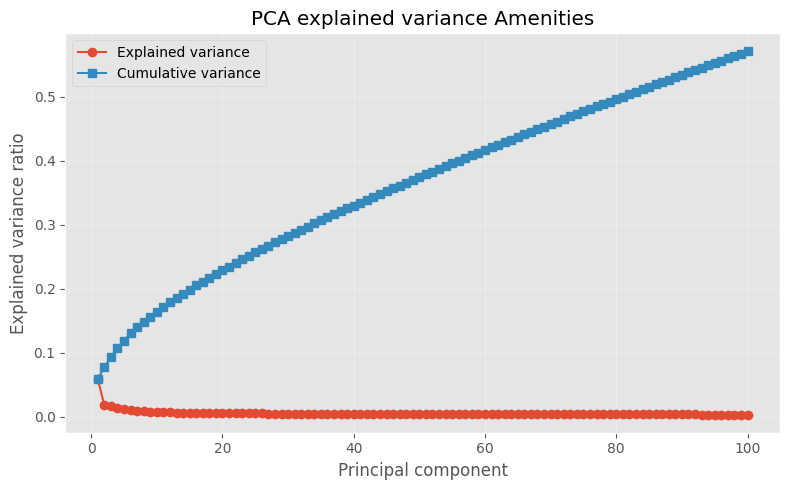

In [74]:
expl_var = amen_pca_model.explained_variance_ratio_
cum_expl_var = np.cumsum(expl_var)
components = np.arange(1, len(expl_var) + 1)

plt.figure(figsize=(8, 5))
plt.plot(components, expl_var, marker='o', label='Explained variance')
plt.plot(components, cum_expl_var, marker='s', label='Cumulative variance')
plt.xlabel('Principal component')
plt.ylabel('Explained variance ratio')
plt.title('PCA explained variance Amenities')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


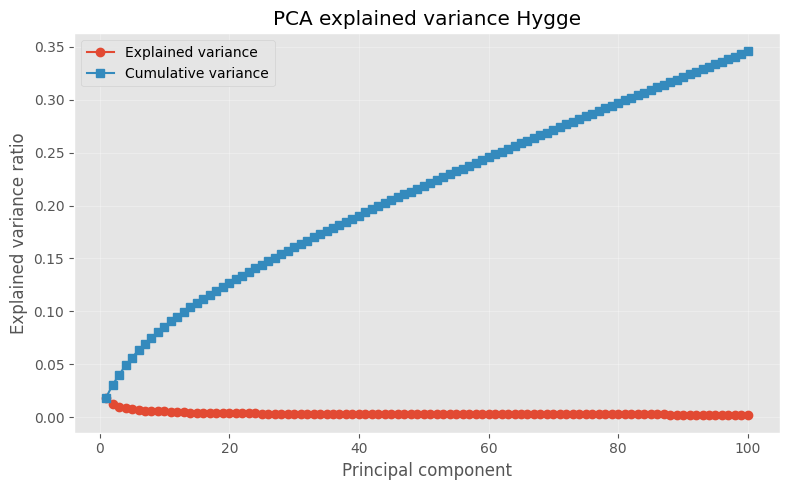

In [75]:
expl_var = hygge_pca_model.explained_variance_ratio_
cum_expl_var = np.cumsum(expl_var)
components = np.arange(1, len(expl_var) + 1)

plt.figure(figsize=(8, 5))
plt.plot(components, expl_var, marker='o', label='Explained variance')
plt.plot(components, cum_expl_var, marker='s', label='Cumulative variance')
plt.xlabel('Principal component')
plt.ylabel('Explained variance ratio')
plt.title('PCA explained variance Hygge')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


In [76]:
features_df.head()

,latitude,longitude,price,accommodates,minimum_nights,amenities_count,hygge_score,room_type,amenities,elements,atmosphere,neighbourhood_cleansed,hygge_pca_0,hygge_pca_1,hygge_pca_2,hygge_pca_3,hygge_pca_4,hygge_pca_5,hygge_pca_6,hygge_pca_7,hygge_pca_8,hygge_pca_9,hygge_pca_10,hygge_pca_11,hygge_pca_12,hygge_pca_13,hygge_pca_14,hygge_pca_15,hygge_pca_16,hygge_pca_17,hygge_pca_18,hygge_pca_19,hygge_pca_20,hygge_pca_21,hygge_pca_22,hygge_pca_23,hygge_pca_24,hygge_pca_25,hygge_pca_26,hygge_pca_27,hygge_pca_28,hygge_pca_29,hygge_pca_30,hygge_pca_31,hygge_pca_32,hygge_pca_33,hygge_pca_34,hygge_pca_35,hygge_pca_36,hygge_pca_37,hygge_pca_38,hygge_pca_39,hygge_pca_40,hygge_pca_41,hygge_pca_42,hygge_pca_43,hygge_pca_44,hygge_pca_45,hygge_pca_46,hygge_pca_47,hygge_pca_48,hygge_pca_49,hygge_pca_50,hygge_pca_51,hygge_pca_52,hygge_pca_53,hygge_pca_54,hygge_pca_55,hygge_pca_56,hygge_pca_57,hygge_pca_58,hygge_pca_59,hygge_pca_60,hygge_pca_61,hygge_pca_62,hygge_pca_63,hygge_pca_64,hygge_pca_65,hygge_pca_66,hygge_pca_67,hygge_pca_68,hygge_pca_69,hygge_pca_70,hygge_pca_71,hygge_pca_72,hygge_pca_73,hygge_pca_74,hygge_pca_75,hygge_pca_76,hygge_pca_77,hygge_pca_78,hygge_pca_79,hygge_pca_80,hygge_pca_81,hygge_pca_82,hygge_pca_83,hygge_pca_84,hygge_pca_85,hygge_pca_86,hygge_pca_87,hygge_pca_88,hygge_pca_89,hygge_pca_90,hygge_pca_91,hygge_pca_92,hygge_pca_93,hygge_pca_94,hygge_pca_95,hygge_pca_96,hygge_pca_97,hygge_pca_98,hygge_pca_99,amen_pca_0,amen_pca_1,amen_pca_2,amen_pca_3,amen_pca_4,amen_pca_5,amen_pca_6,amen_pca_7,amen_pca_8,amen_pca_9,amen_pca_10,amen_pca_11,amen_pca_12,amen_pca_13,amen_pca_14,amen_pca_15,amen_pca_16,amen_pca_17,amen_pca_18,amen_pca_19,amen_pca_20,amen_pca_21,amen_pca_22,amen_pca_23,amen_pca_24,amen_pca_25,amen_pca_26,amen_pca_27,amen_pca_28,amen_pca_29,amen_pca_30,amen_pca_31,amen_pca_32,amen_pca_33,amen_pca_34,amen_pca_35,amen_pca_36,amen_pca_37,amen_pca_38,amen_pca_39,amen_pca_40,amen_pca_41,amen_pca_42,amen_pca_43,amen_pca_44,amen_pca_45,amen_pca_46,amen_pca_47,amen_pca_48,amen_pca_49,amen_pca_50,amen_pca_51,amen_pca_52,amen_pca_53,amen_pca_54,amen_pca_55,amen_pca_56,amen_pca_57,amen_pca_58,amen_pca_59,amen_pca_60,amen_pca_61,amen_pca_62,amen_pca_63,amen_pca_64,amen_pca_65,amen_pca_66,amen_pca_67,amen_pca_68,amen_pca_69,amen_pca_70,amen_pca_71,amen_pca_72,amen_pca_73,amen_pca_74,amen_pca_75,amen_pca_76,amen_pca_77,amen_pca_78,amen_pca_79,amen_pca_80,amen_pca_81,amen_pca_82,amen_pca_83,amen_pca_84,amen_pca_85,amen_pca_86,amen_pca_87,amen_pca_88,amen_pca_89,amen_pca_90,amen_pca_91,amen_pca_92,amen_pca_93,amen_pca_94,amen_pca_95,amen_pca_96,amen_pca_97,amen_pca_98,amen_pca_99
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
29118,55.670230,12.555040,900,2,7,29,70.0,Entire home/apt,"[""Backyard"", ""Dining table"", ""Essentials"", ""Pa...","['wood floor', 'dining table', 'chairs', 'benc...","['warm', 'inviting', 'lived-in', 'functional',...",Vesterbro-Kongens Enghave,2.499383,5.603059,-2.351321,-2.237059,4.605867,-4.670232,-1.279392,3.098497,2.530898,-1.098374,-0.091094,-0.582696,1.829056,0.687716,2.815090,0.114566,-3.339758,1.611812,3.114625,0.407369,0.798905,0.663863,-0.570665,0.333927,-0.273333,-0.528957,-0.686085,0.439254,0.658929,-0.183242,0.797710,-0.830095,-0.888690,-0.007047,0.131596,0.279920,-0.199820,0.672308,0.266488,0.616260,-0.341398,-0.055070,-1.056771,0.851187,0.239381,0.463094,-1.067180,-1.318494,-0.069937,2.280998,0.259093,0.391671,1.552685,1.778384,1.100959,-2.946949,1.260258,-0.495887,3.445947,1.147499,2.791267,1.060391,0.299843,0.869715,0.516567,-0.531283,2.836040,-0.968559,-0.535740,1.342964,2.609171,-2.545091,1.107395,0.937599,-2.277189,-2.095406,0.527017,1.176304,0.161537,0.405907,2.013537,-0.947991,-1.085414,-0.069106,1.990156,2.703623,0.009711,0.044307,3.253263,0.769175,-1.378286,-0.171311,1.234319,-1.480811,-1.712052,2.105069,-0.316239,1

In [77]:
df_clust = features_df.copy()

numeric_cols = [
    "latitude",
    "longitude",
    "price",
    "accommodates",
    "minimum_nights",
    "amenities_count",
    "hygge_score",
]

hygge_pca_cols = [f"hygge_pca_{i}" for i in range(10)]
amen_pca_cols  = [f"amen_pca_{i}"  for i in range(10)]

final_features = pd.concat(
    [
        df_clust[numeric_cols + hygge_pca_cols + amen_pca_cols],
        room_dummies,
        neigh_dummies,
    ],
    axis=1,
)

print("Final feature matrix shape:", final_features.shape)
print(final_features.columns)

final_features.head()


Final feature matrix shape: (12804, 42)
Index(['latitude', 'longitude', 'price', 'accommodates', 'minimum_nights',
       'amenities_count', 'hygge_score', 'hygge_pca_0', 'hygge_pca_1',
       'hygge_pca_2', 'hygge_pca_3', 'hygge_pca_4', 'hygge_pca_5',
       'hygge_pca_6', 'hygge_pca_7', 'hygge_pca_8', 'hygge_pca_9',
       'amen_pca_0', 'amen_pca_1', 'amen_pca_2', 'amen_pca_3', 'amen_pca_4',
       'amen_pca_5', 'amen_pca_6', 'amen_pca_7', 'amen_pca_8', 'amen_pca_9',
       'room_Entire home/apt', 'room_Hotel room', 'room_Private room',
       'room_Shared room', 'neigh_Amager Vest', 'neigh_Amager st',
       'neigh_Bispebjerg', 'neigh_Brnshj-Husum', 'neigh_Frederiksberg',
       'neigh_Indre By', 'neigh_Nrrebro', 'neigh_Valby', 'neigh_Vanlse',
       'neigh_Vesterbro-Kongens Enghave', 'neigh_sterbro'],
      dtype='object')


,latitude,longitude,price,accommodates,minimum_nights,amenities_count,hygge_score,hygge_pca_0,hygge_pca_1,hygge_pca_2,hygge_pca_3,hygge_pca_4,hygge_pca_5,hygge_pca_6,hygge_pca_7,hygge_pca_8,hygge_pca_9,amen_pca_0,amen_pca_1,amen_pca_2,amen_pca_3,amen_pca_4,amen_pca_5,amen_pca_6,amen_pca_7,amen_pca_8,amen_pca_9,room_Entire home/apt,room_Hotel room,room_Private room,room_Shared room,neigh_Amager Vest,neigh_Amager st,neigh_Bispebjerg,neigh_Brnshj-Husum,neigh_Frederiksberg,neigh_Indre By,neigh_Nrrebro,neigh_Valby,neigh_Vanlse,neigh_Vesterbro-Kongens Enghave,neigh_sterbro
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
29118,55.670230,12.555040,900,2,7,29,70.0,2.499383,5.603059,-2.351321,-2.237059,4.605867,-4.670232,-1.279392,3.098497,2.530898,-1.098374,0.454975,4.089211,2.329870,-2.276685,-0.423727,0.679636,-3.081046,-0.331956,1.090069,-1.979757,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
32379,55.672638,12.552493,2282,4,3,43,65.0,2.453329,-2.342182,1.039545,1.392786,0.392456,-1.784563,-0.454271,0.360303,-1.360460,1.654759,3.345425,3.751857,0.206609,1.145161,0.041961,0.049130,-1.434900,-0.640325,0.149745,0.681027,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
38499,55.684288,12.573019,2223,6,5,36,65.0,0.662623,5.930671,-3.545376,-0.909897,4.134165,-4.014188,0.134127,-1.834996,2.518132,-0.246487,2.896002,0.068508,-2.067962,0.814617,0.041163,-0.091010,-2.656011,-0.611907,0.977463,2.048267,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
39055,55.665070,12.583150,1760,4,2,37,65.0,0.623597,-1.041384,0.031577,-0.244544,-0.830383,2.054005,0.178332,-4.424612,-0.493641,0.122005,3.335978,1.753579,-2.285484,-0.104152,0.375760,1.055316,-1.874742,-1.040232,0.591397,0.705975,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
65902,55.707100,12.553860,470,2,3,10,72.0,2.721171,-2.294367,1.587560,1.938413,0.045092,-1.825014,-0.157745,0.975654,-1.314620,0.441226,-3.681105,0.261532,0.058211,0.676787,-0.026021,-0.876532,-1.624097,0.755483,-1.331677,0.066617,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


In [78]:
# df_clust = features_df.copy()

# numeric_cols = [
#     "latitude",
#     "longitude",
#     "price",
#     "accommodates",
#     "minimum_nights",
#     "amenities_count",
#     "hygge_score",
# ]

# final_features = pd.concat(
#     [
#         df_clust[numeric_cols],
#         room_dummies,
#         neigh_dummies,
#         elem_df, atmo_df, amen_df
#     ],
#     axis=1,
# )

# print("Final feature matrix shape:", final_features.shape)
# print(final_features.columns)

# final_features.head()


,latitude,longitude,price,accommodates,minimum_nights,amenities_count,hygge_score,hygge_pca_0,hygge_pca_1,hygge_pca_2,hygge_pca_3,hygge_pca_4,hygge_pca_5,hygge_pca_6,hygge_pca_7,hygge_pca_8,hygge_pca_9,amen_pca_0,amen_pca_1,amen_pca_2,amen_pca_3,amen_pca_4,amen_pca_5,amen_pca_6,amen_pca_7,amen_pca_8,amen_pca_9,room_Entire home/apt,room_Hotel room,room_Private room,room_Shared room,neigh_Amager Vest,neigh_Amager st,neigh_Bispebjerg,neigh_Brnshj-Husum,neigh_Frederiksberg,neigh_Indre By,neigh_Nrrebro,neigh_Valby,neigh_Vanlse,neigh_Vesterbro-Kongens Enghave,neigh_sterbro
latitude,1.000000,-0.230848,-0.011902,-0.057745,0.018342,-0.084633,0.112969,9.568996e-02,-4.858958e-02,-4.137570e-02,4.553777e-02,4.776013e-02,-8.025363e-02,-3.260991e-02,-8.409277e-03,2.101893e-02,-9.443173e-02,-7.177253e-02,1.038213e-02,-8.336010e-02,-1.036352e-01,-5.796605e-02,-8.064448e-02,-8.472245e-02,7.234723e-02,-1.254960e-02,-2.360128e-02,0.042781,-0.008115,-0.042406,-0.002148,-0.461712,-0.309945,0.297724,0.185262,0.029837,0.040913,0.330965,-0.187198,0.089740,-0.373196,0.463433
longitude,-0.230848,1.000000,0.113175,0.029063,-0.022774,0.041348,-0.044493,-2.523541e-02,3.828208e-02,1.056020e-01,-3.290281e-02,2.316321e-03,5.995532e-02,4.204770e-02,-2.822819e-02,-2.539366e-02,1.216305e-02,3.758104e-02,5.731390e-02,-5.656369e-03,1.168239e-01,-1.866256e-02,9.789686e-02,7.117277e-03,8.289313e-03,2.712873e-02,-4.073763e-02,0.034033,0.008377,-0.037022,0.016794,0.262348,0.526124,-0.188141,-0.287911,-0.288903,0.305933,-0.137299,-0.347918,-0.327061,-0.161051,0.214817
price,-0.011902,0.113175,1.000000,0.357182,-0.005049,0.114236,0.006115,-5.123605e-02,2.676163e-02,-2.192322e-02,-1.417765e-01,-6.350732e-02,4.175858e-02,5.767852e-02,-3.688379e-02,1.301411e-02,4.003612e-02,9.360937e-02,7.818756e-02,1.227491e-01,4.954660e-02,-3.964541e-02,7.950551e-02,5.263211e-02,-4.144621e-02,7.702687e-02,3.468550e-02,0.172035,-0.001325,-0.169713,-0.028352,-0.008424,-0.031342,-0.068284,-0.031977,0.007395,0.209252,-0.074499,-0.049124,-0.042750,-0.029484,0.010650
accommodates,-0.057745,0.029063,0.357182,1.000000,0.120272,0.252248,-0.010339,-1.294871e-01,2.026410e-02,-1.825358e-01,-2.096739e-01,-1.214913e-01,-1.613009e-03,6.133876e-02,-1.130690e-02,1.925733e-02,8.757432e-02,2.194911e-01,5.564626e-02,3.563804e-01,-2.843674e-02,-7.636114e-02,3.837198e-02,9.305475e-02,-1.765440e-01,1.223177e-01,6.718329e-02,0.252021,0.010961,-0.250768,-0.030836,0.043387,0.028062,-0.030060,0.088527,-0.011809,0.090112,-0.097890,0.021780,0.032506,-0.048562,-0.030386
minimum_nights,0.018342,-0.022774,-0.005049,0.120272,1.000000,0.093782,0.029389,-6.961578e-02,-3.693977e-02,-9.254685e-02,-8.998778e-02,3.229745e-02,-2.442915e-02,-1.382558e-02,1.553034e-02,4.690827e-02,1.288843e-03,9.211913e-02,-7.780122e-02,1.223267e-01,-1.307521e-01,1.036233e-01,-2.010804e-02,-5.825443e-02,-4.875032e-02,2.388287e-02,2.883175e-02,0.160157,-0.019366,-0.155483,-0.037587,0.015413,-0.012448,-0.008557,0.018695,0.017555,-0.060197,0.010568,-0.008491,0.013287,0.007431,0.026101
amenities_count,-0.084633,0.041348,0.114236,0.252248,0.093782,1.000000,0.015897,-8.879506e-02,8.156395e-03,-6.576329e-02,-1.220642e-01,-7.535194e-03,4.953729e-02,4.803702e-02,-1.141605e-02,1.443438e-02,7.177177e-02,9.889588e-01,4.596454e-02,5.057169e-02,1.159423e-03,1.445119e-02,1.018882e-03,6.304970e-02,-1.952106e-02,3.918693e-03,1.028806e-02,0.098749,-0.018825,-0.095284,-0.024615,0.061094,0.035617,-0.039250,0.018585,-0.009360,0.017017,-0.060784,-0.000578,0.010345,0.007549,-0.020442
hygge_score,0.112969,-0.044493,0.006115,-0.010339,0.029389,0.015897,1.000000,5.223475e-01,-3.772219e-01,-3.227520e-01,-6.951465e-02,2.407920e-01,-5.308464e-02,1.618862e-01,4.614925e-02,1.250171e-01,-1.075996e-01,2.679159e-02,-1.635819e-02,-6.377813e-02,-1.529382e-01,-3.967966e-02,-8.890462e-02,-5.860755e-02,-1.470373e-02,-2.792259e-03,-5.195787e-03,0.130068,-0.025366,-0.119836,-0.075144,-0.088899,-0.016238,0.025622,-0.017933,0.016842,-0.032789,0.083936,0.009282,-0.002734,-0.020855,0.02884

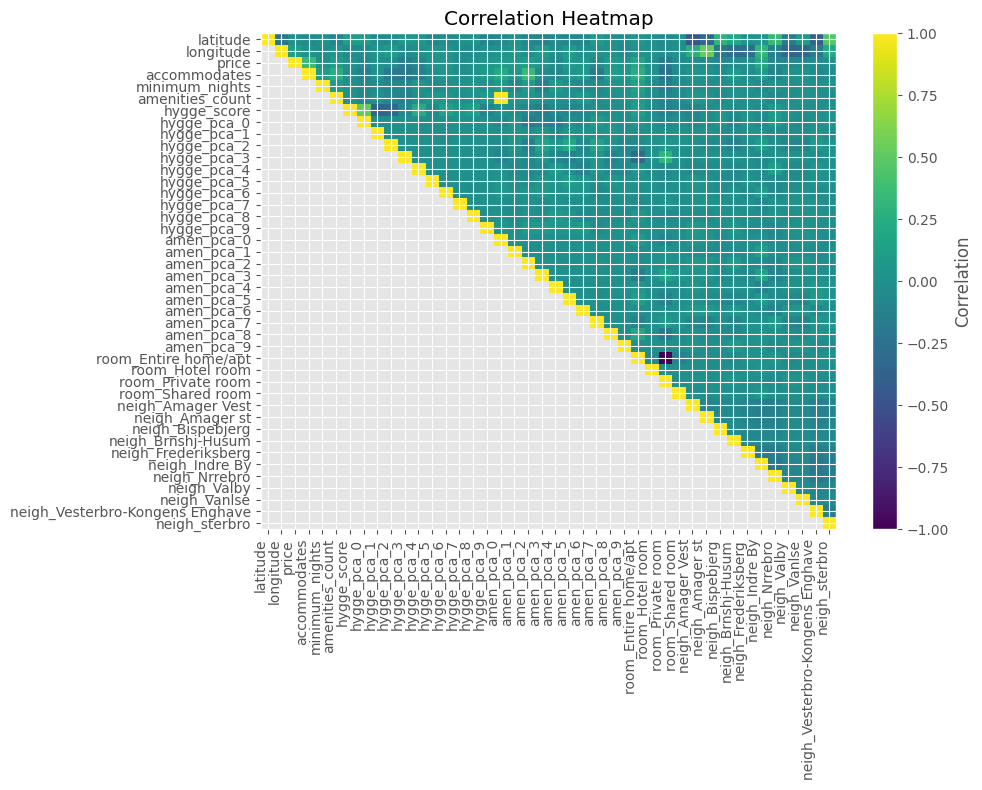

In [79]:
corr = final_features.corr()
display(corr)
mask = np.tril(np.ones_like(corr, dtype=bool), k=-1)
corr_masked = np.ma.array(corr.values, mask=mask)

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(corr_masked, aspect="auto", vmin=-1, vmax=1)

ax.set_xticks(np.arange(len(corr.columns)))
ax.set_yticks(np.arange(len(corr.columns)))
ax.set_xticklabels(corr.columns, rotation=90, ha="right")
ax.set_yticklabels(corr.columns)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Correlation", rotation=90)

ax.set_title("Correlation Heatmap")
plt.tight_layout()
plt.show()

In [80]:
pd.set_option("display.max_rows", None)
corrs = show_correlations(corr)
corrs

,feature_1,feature_2,corr
206,amenities_count,amen_pca_0,0.988959
71,longitude,neigh_Amager st,0.526124
231,hygge_score,hygge_pca_0,0.522348
757,room_Entire home/apt,room_Private room,-0.989799


### 3.3.4. Final features
- the first pcas of amenities and hygge seem to catch the count and score params, so we will keep just pca
- entire home and private room correlate so we will only use 1
- a hopkins score of <0.1 suggests dispersed points with no meaningful clustering, suggesting that dbscan will not produce meaningful results

In [81]:
cols_no_geo = [c for c in final_features.columns if c not in ["latitude", "longitude"]]
cols_no_geo

['price',
 'accommodates',
 'minimum_nights',
 'amenities_count',
 'hygge_score',
 'hygge_pca_0',
 'hygge_pca_1',
 'hygge_pca_2',
 'hygge_pca_3',
 'hygge_pca_4',
 'hygge_pca_5',
 'hygge_pca_6',
 'hygge_pca_7',
 'hygge_pca_8',
 'hygge_pca_9',
 'amen_pca_0',
 'amen_pca_1',
 'amen_pca_2',
 'amen_pca_3',
 'amen_pca_4',
 'amen_pca_5',
 'amen_pca_6',
 'amen_pca_7',
 'amen_pca_8',
 'amen_pca_9',
 'room_Entire home/apt',
 'room_Hotel room',
 'room_Private room',
 'room_Shared room',
 'neigh_Amager Vest',
 'neigh_Amager st',
 'neigh_Bispebjerg',
 'neigh_Brnshj-Husum',
 'neigh_Frederiksberg',
 'neigh_Indre By',
 'neigh_Nrrebro',
 'neigh_Valby',
 'neigh_Vanlse',
 'neigh_Vesterbro-Kongens Enghave',
 'neigh_sterbro']

In [82]:
#final clustering df
df_clustering = final_features.copy()
df_clustering=df_clustering.reset_index()
df_clustering.to_csv("final_clustering_features.csv")
df_clustering.head()

,id,latitude,longitude,price,accommodates,minimum_nights,amenities_count,hygge_score,hygge_pca_0,hygge_pca_1,hygge_pca_2,hygge_pca_3,hygge_pca_4,hygge_pca_5,hygge_pca_6,hygge_pca_7,hygge_pca_8,hygge_pca_9,amen_pca_0,amen_pca_1,amen_pca_2,amen_pca_3,amen_pca_4,amen_pca_5,amen_pca_6,amen_pca_7,amen_pca_8,amen_pca_9,room_Entire home/apt,room_Hotel room,room_Private room,room_Shared room,neigh_Amager Vest,neigh_Amager st,neigh_Bispebjerg,neigh_Brnshj-Husum,neigh_Frederiksberg,neigh_Indre By,neigh_Nrrebro,neigh_Valby,neigh_Vanlse,neigh_Vesterbro-Kongens Enghave,neigh_sterbro
0,29118,55.670230,12.555040,900,2,7,29,70.0,2.499383,5.603059,-2.351321,-2.237059,4.605867,-4.670232,-1.279392,3.098497,2.530898,-1.098374,0.454975,4.089211,2.329870,-2.276685,-0.423727,0.679636,-3.081046,-0.331956,1.090069,-1.979757,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,32379,55.672638,12.552493,2282,4,3,43,65.0,2.453329,-2.342182,1.039545,1.392786,0.392456,-1.784563,-0.454271,0.360303,-1.360460,1.654759,3.345425,3.751857,0.206609,1.145161,0.041961,0.049130,-1.434900,-0.640325,0.149745,0.681027,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,38499,55.684288,12.573019,2223,6,5,36,65.0,0.662623,5.930671,-3.545376,-0.909897,4.134165,-4.014188,0.134127,-1.834996,2.518132,-0.246487,2.896002,0.068508,-2.067962,0.814617,0.041163,-0.091010,-2.656011,-0.611907,0.977463,2.048267,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,39055,55.665070,12.583150,1760,4,2,37,65.0,0.623597,-1.041384,0.031577,-0.244544,-0.830383,2.054005,0.178332,-4.424612,-0.493641,0.122005,3.335978,1.753579,-2.285484,-0.104152,0.375760,1.055316,-1.874742,-1.040232,0.591397,0.705975,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,65902,55.707100,12.553860,470,2,3,10,72.0,2.721171,-2.294367,1.587560,1.938413,0.045092,-1.825014,-0.157745,0.975654,-1.314620,0.441226,-3.681105,0.261532,0.058211,0.676787,-0.026021,-0.876532,-1.624097,0.755483,-1.331677,0.066617,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


In [83]:
df_clustering = pd.read_csv("./final_clustering_features.csv")

In [84]:
# scale
# 0) Make sure both dataframes have an 'id' column
if "id" not in features_df.columns:
    features_df = features_df.reset_index().rename(columns={"index": "id"})

if "id" not in final_features.columns:
    final_features = final_features.reset_index().rename(columns={"index": "id"})

# 1) Exclude geo / overly-dominant / redundant columns from clustering
cols_exclude = [
    "latitude",
    "longitude",
    "amenities_count",
    "room_Private room",  # redundant with other room dummies
]

cols_no_geo = [c for c in final_features.columns if c not in cols_exclude]

# 2) Build df_clustering (id + features used for DBSCAN)
df_clustering = final_features[cols_no_geo].copy()

# Ensure we have an explicit id column
if "id" not in df_clustering.columns:
    df_clustering = df_clustering.reset_index().rename(columns={"index": "id"})

# 3) Build X_scaled from df_clustering (drop id)

feature_cols = [c for c in df_clustering.columns if c != "id"]
X = df_clustering[feature_cols].values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [85]:
#hopkins all features
# cols_no_geo = [c for c in final_features.columns if c not in ["latitude", "longitude", 'amenities_count', 'room_Private room']]

# scaler_all = StandardScaler()
# X_scaled = scaler_all.fit_transform(df_clustering[cols_no_geo])

H = hopkins(X_scaled, X_scaled.shape[0])
print(f"Hopkins: {H:.3f}")

Hopkins: 0.070


# 4. Clustering with advanced features

## 4.1 DBSCAN

- tuning eps (neighbourhood radius)
    - Running k-distance plot: n_neighbours often = min_samples, which has a heuristic of n_dim*2 or >n_dim+1, but with 35 dimensions, this is quite high. However, even k=5 gives an elbow around 4-6.
- tuning min_samples (min points that must lie in neighbourhood for to make a point a core point). If set to a higher value, DBSCAN will find denser clusters; lower value, clusters will be more sparse.

### 4.1.1. Tuning eps
- Running k-distance plot: n_neighbours often = min_samples, which has a heuristic of n_dim*2 or n_dim+1: elbow is between 4-6 (Sanders)
- eps ≤ 1.5 is all noise; 2–3 has negative silhouette scores (clusters are worse than random partitioning), 3.5–6 noise drops, silhouette becomes positive but small, clusters are only mildly better than random:
- DBI (<0.5 good structure, 1 is alright and 2 is weak) / silhouette (-1 to 1, where 0 is random and 1 is very strong separation and -1 is no clusters)

40


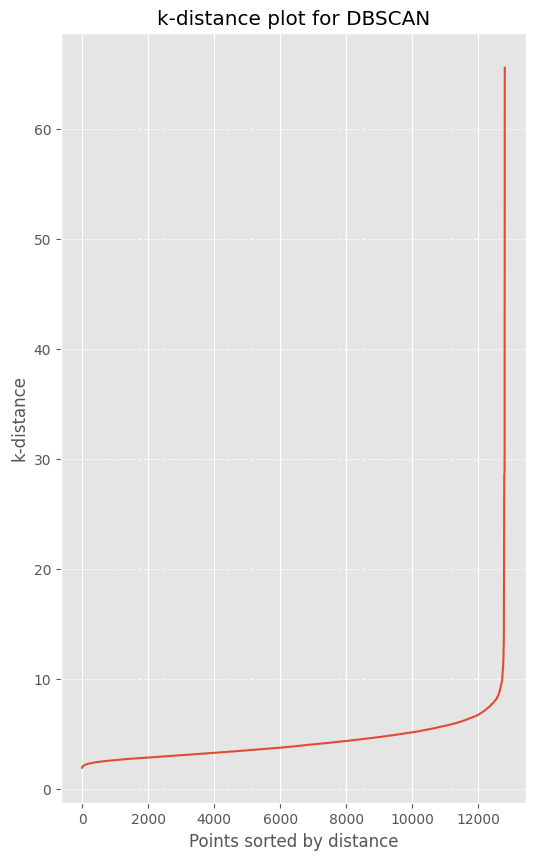

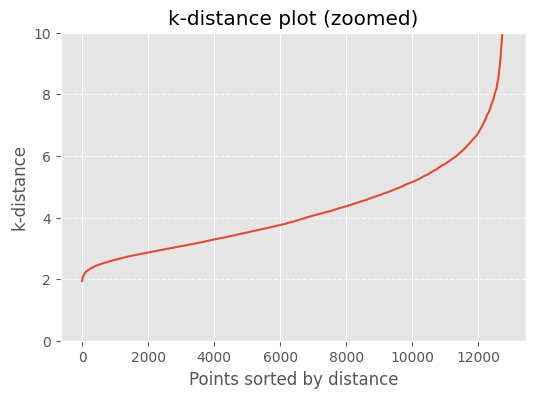

In [86]:
# k-distance plot
n = len(df_clustering.columns)+1
print(n)
neighbors = NearestNeighbors(n_neighbors=n)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)

k_distances = np.sort(distances[:, n-1])

plt.figure(figsize=(6, 10))
plt.plot(k_distances)
plt.title("k-distance plot for DBSCAN")
plt.xlabel("Points sorted by distance")
plt.ylabel("k-distance")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

#zoom
plt.figure(figsize=(6, 4))
plt.plot(k_distances)
plt.title("k-distance plot (zoomed)")
plt.xlabel("Points sorted by distance")
plt.ylabel("k-distance")
plt.ylim(0, 10)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

In [87]:
#grid search based on k plot
def tune_eps(eps_candidates=1.0):
    for eps in eps_candidates:
        labels = DBSCAN(eps=eps, min_samples=13).fit_predict(X_scaled)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        if n_clusters > 1:
            sil = silhouette_score(X_scaled, labels)
            dbi = davies_bouldin_score(X_scaled, labels)
            print(f"eps={eps:.2f}: clusters={n_clusters}, noise={n_noise}, "
                f"sil={sil:.3f}, DBI={dbi:.3f}")
        else:
            print(f"eps={eps:.2f}: clusters={n_clusters}, noise={n_noise}")

eps_candidates = np.arange(5.5, 8.5, 0.25)
tune_eps(eps_candidates=eps_candidates)

eps=5.50: clusters=5, noise=492, sil=0.130, DBI=2.876
eps=5.75: clusters=5, noise=349, sil=0.153, DBI=2.455
eps=6.00: clusters=4, noise=261, sil=0.210, DBI=2.461
eps=6.25: clusters=4, noise=203, sil=0.214, DBI=2.397
eps=6.50: clusters=4, noise=158, sil=0.214, DBI=2.379
eps=6.75: clusters=4, noise=108, sil=0.215, DBI=2.288
eps=7.00: clusters=3, noise=86, sil=0.306, DBI=2.287
eps=7.25: clusters=3, noise=66, sil=0.308, DBI=2.201
eps=7.50: clusters=3, noise=49, sil=0.308, DBI=2.154
eps=7.75: clusters=3, noise=41, sil=0.308, DBI=2.141
eps=8.00: clusters=3, noise=35, sil=0.308, DBI=2.144
eps=8.25: clusters=3, noise=31, sil=0.308, DBI=2.135


In [88]:
eps_candidates = np.arange(7.5, 8.5, 0.25)
tune_eps(eps_candidates=eps_candidates)

eps=7.50: clusters=3, noise=49, sil=0.308, DBI=2.154
eps=7.75: clusters=3, noise=41, sil=0.308, DBI=2.141
eps=8.00: clusters=3, noise=35, sil=0.308, DBI=2.144
eps=8.25: clusters=3, noise=31, sil=0.308, DBI=2.135


- Silhouette is completely flat at from 7.25–8.25
- DBI keeps improving but only marginally
- Noise shrinks as eps grows

### 4.1.2. Minsamples tuning

In [89]:
for ms in np.arange(10,30,10):
    labels = DBSCAN(eps=7.5, min_samples=ms).fit_predict(X_scaled)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    print(f"min_samples={ms}: clusters={n_clusters}, noise={n_noise}")

min_samples=10: clusters=3, noise=49
min_samples=20: clusters=2, noise=69


In [90]:
for ms in np.arange(5,20,5):
    labels = DBSCAN(eps=7.5, min_samples=ms).fit_predict(X_scaled)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    print(f"min_samples={ms}: clusters={n_clusters}, noise={n_noise}")

min_samples=5: clusters=4, noise=40
min_samples=10: clusters=3, noise=49
min_samples=15: clusters=3, noise=52


### 4.1.3. Final values and interpretation
- one big 'normal listing' cluster

In [91]:
def run_dbscan(
    X_scaled,
    df_features,          # e.g. df_clustering (has id + numeric features)
    eps=5,
    min_samples=5,
    col_prefix="cluster_dbscan",
    geo_df=None,          # e.g. features_df (has id + longitude + latitude)
    id_col="id",
):
    """
    Run DBSCAN on X_scaled, attach labels to df_features, and
    (optionally) plot them on geo_df using longitude/latitude matched by id.
    """
    # 1) run DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(X_scaled)

    # 2) name of the new cluster column
    col_name = f"{col_prefix}_{eps}_{min_samples}"   # e.g. "cluster_dbscan_5_5"

    # 3) store labels in the feature dataframe
    df_features[col_name] = labels

    # 4) cluster stats
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)

    print(f"Estimated number of clusters: {n_clusters}")
    print(f"Noise points: {n_noise}")

    if n_clusters > 1:
        sil = silhouette_score(X_scaled, labels)
        dbi = davies_bouldin_score(X_scaled, labels)
        print(f"Silhouette Score: {sil:.3f}")
        print(f"Davies–Bouldin Index: {dbi:.3f}")

    print("\nCluster sizes:")
    print(df_features[col_name].value_counts().sort_index())

    # 5) if we have a geo_df with coords, merge by id and plot
    if geo_df is not None and {"longitude", "latitude", id_col}.issubset(geo_df.columns):
        # merge cluster labels onto geo_df by id so rows line up correctly
        geo_plot = geo_df.merge(
            df_features[[id_col, col_name]],
            on=id_col,
            how="inner",
        )

        gdf = gpd.GeoDataFrame(
            geo_plot,
            geometry=gpd.points_from_xy(geo_plot.longitude, geo_plot.latitude),
            crs="EPSG:4326",
        ).to_crs(epsg=3857)

        fig, ax = plt.subplots(figsize=(10, 8))
        gdf.plot(
            ax=ax,
            column=col_name,
            categorical=True,
            cmap="Paired",
            markersize=5,
            alpha=0.7,
            legend=True,
        )
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
        ax.set_title(f"DBSCAN Clusters (eps={eps}, min_samples={min_samples})", fontsize=14)
        ax.set_axis_off()
        plt.tight_layout()
        plt.show()
    else:
        print("\nNo valid geo_df provided (with id + longitude + latitude); skipping map.")

    return labels, col_name

def interpret_clusters(df, cluster_col, z_threshold=1.0, top_n=None):
    """
    Plot cluster-wise median z-scores and list, for each cluster,
    the features with |median z-score| >= z_threshold.

    Parameters
    ----------
    df : pd.DataFrame
        Dataframe containing numeric features and a cluster label column.
    cluster_col : str
        Name of the cluster column in df (e.g. "cluster_dbscan_5_5").
    z_threshold : float, optional
        Absolute z-score cutoff for listing standout features per cluster.
    top_n : int or None, optional
        If set, only show the top_n features (by |z|) per cluster.
    """
    # 1) pick all numeric columns
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

    # 2) build an exclude list: this cluster label, any other cluster_* cols, and id
    exclude = {cluster_col}
    exclude.update([c for c in num_cols if c.startswith("cluster_")])
    if "id" in num_cols:
        exclude.add("id")

    # keep only numeric feature columns (no IDs / cluster labels)
    num_cols = [c for c in num_cols if c not in exclude]

    # 3) z-score the feature matrix
    df_heat_z = df[num_cols].copy()
    df_heat_z = (df_heat_z - df_heat_z.mean()) / df_heat_z.std()
    df_heat_z = df_heat_z.replace([np.inf, -np.inf], np.nan).fillna(0)

    # 4) attach cluster labels
    df_heat_z[cluster_col] = df[cluster_col].values

    # 5) median z-scores per cluster
    summary = (
        df_heat_z
        .groupby(cluster_col)[num_cols]
        .median()
        .round(2)
    )

    # ---------- HEATMAP ----------
    data = summary.values
    rows = summary.index.astype(str)
    cols = num_cols

    fig, ax = plt.subplots(figsize=(12, 5))
    im = ax.imshow(data, aspect="auto")

    ax.set_xticks(np.arange(len(cols)))
    ax.set_yticks(np.arange(len(rows)))
    ax.set_xticklabels(cols, rotation=45, ha="right", fontsize=7)
    ax.set_yticklabels(rows)

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Median (z-score)", rotation=90)

    ax.set_title(f"DBSCAN Cluster Feature Medians (z-scores): {cluster_col}")
    plt.tight_layout()
    plt.show()

    # ---------- TEXT SUMMARY OF STANDOUT FEATURES ----------
    print(f"\nFeatures with |median z-score| >= {z_threshold} by cluster:\n")

    for cl, row in summary.iterrows():
        # select features exceeding threshold in absolute value
        hits = row[row.abs() >= z_threshold]

        if hits.empty:
            continue

        # sort by absolute z descending
        hits = hits.reindex(hits.abs().sort_values(ascending=False).index)

        if top_n is not None:
            hits = hits.iloc[:top_n]

        print(f"Cluster {cl}:")
        for feat, val in hits.items():
            print(f"  {feat}: {val:+.2f}")
        print()  # blank line between clusters

    return summary


Estimated number of clusters: 12
Noise points: 625
Silhouette Score: 0.118
Davies–Bouldin Index: 1.890

Cluster sizes:
cluster_dbscan_5_5
-1       625
 0     10725
 1       451
 2       499
 3       277
 4       171
 5        15
 6         5
 7        12
 8         6
 9         7
 10        6
 11        5
Name: count, dtype: int64


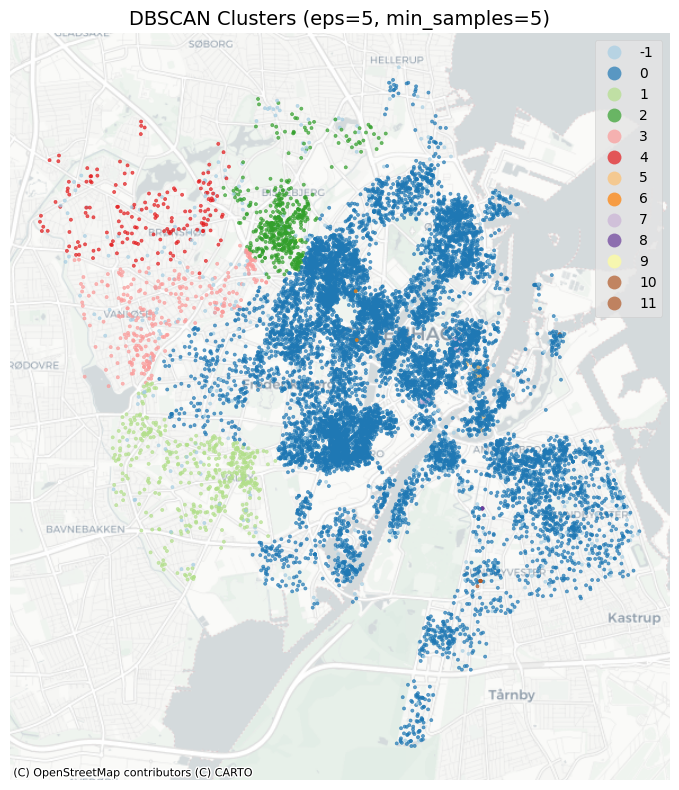

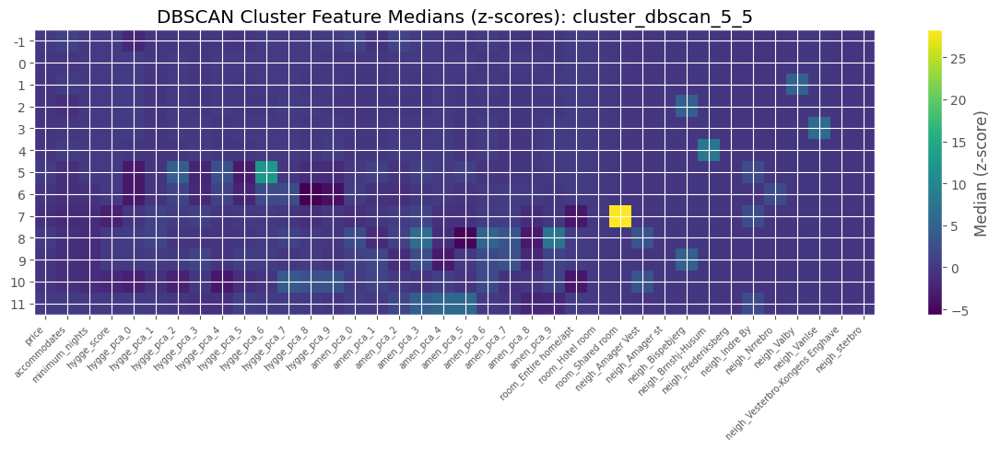


Features with |median z-score| >= 1.0 by cluster:

Cluster -1:
  hygge_pca_0: -1.85
  amen_pca_2: +1.30
  amen_pca_0: +1.25

Cluster 1:
  neigh_Valby: +5.03

Cluster 2:
  neigh_Bispebjerg: +4.73

Cluster 3:
  neigh_Vanlse: +6.22

Cluster 4:
  neigh_Brnshj-Husum: +7.76

Cluster 5:
  hygge_pca_6: +12.39
  hygge_pca_2: +4.51
  hygge_pca_0: -3.22
  hygge_pca_5: -3.17
  hygge_pca_4: +2.73
  neigh_Indre By: +2.24
  hygge_pca_3: -2.11
  hygge_pca_9: -1.41
  hygge_pca_8: -1.19

Cluster 6:
  hygge_pca_8: -5.59
  hygge_pca_9: -4.20
  hygge_pca_0: -3.27
  neigh_Nrrebro: +2.23
  hygge_pca_7: +2.11
  hygge_pca_6: +2.09
  hygge_pca_5: -2.04
  hygge_pca_3: -1.87
  hygge_pca_2: +1.16
  hygge_pca_4: +1.14

Cluster 7:
  room_Shared room: +28.27
  room_Entire home/apt: -3.41
  hygge_score: -2.54
  neigh_Indre By: +2.24
  accommodates: -1.42
  amen_pca_3: +1.41
  minimum_nights: -1.27
  amen_pca_8: -1.11
  amen_pca_0: -1.04
  hygge_pca_8: -1.04

Cluster 8:
  amen_pca_9: +7.54
  amen_pca_3: +6.50
  amen_p

In [92]:
# 4) Run DBSCAN (eps=5, min_samples=5) and plot on the map using features_df for coords
labels_55, col_55 = run_dbscan(
    X_scaled=X_scaled,
    df_features=df_clustering,   # where cluster labels are stored
    eps=5,
    min_samples=5,
    col_prefix="cluster_dbscan",
    geo_df=features_df,          # has id + latitude + longitude
    id_col="id",
)

# 5) Interpret clusters: heatmap + standout features by z-score
summary_55 = interpret_clusters(
    df_clustering,
    cluster_col=col_55,   # "cluster_dbscan_5_5"
    z_threshold=1.0,
    top_n=None,
)

Estimated number of clusters: 6
Noise points: 803
Silhouette Score: 0.123
Davies–Bouldin Index: 2.513

Cluster sizes:
cluster_dbscan_5_10
-1      803
 0    10620
 1      441
 2      495
 3      271
 4      162
 5       12
Name: count, dtype: int64


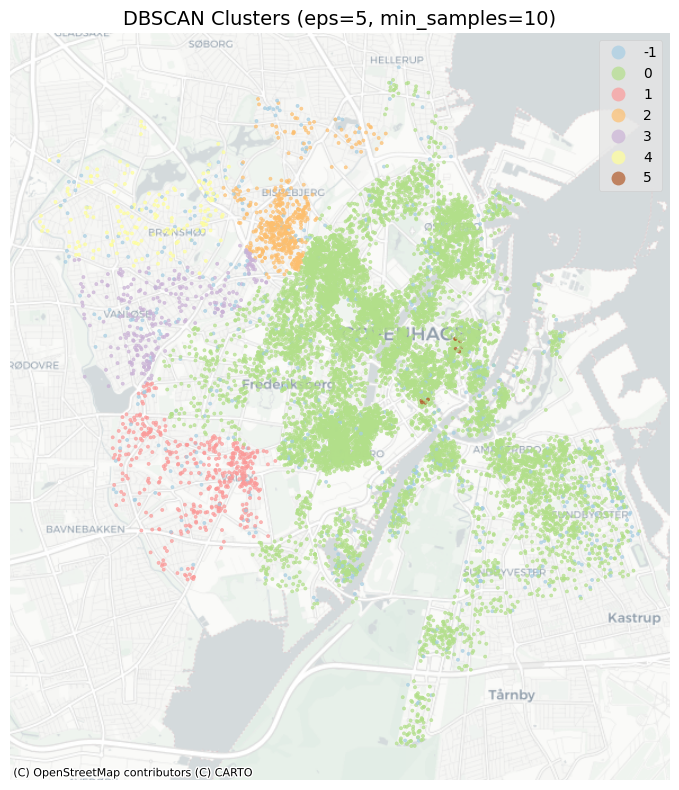

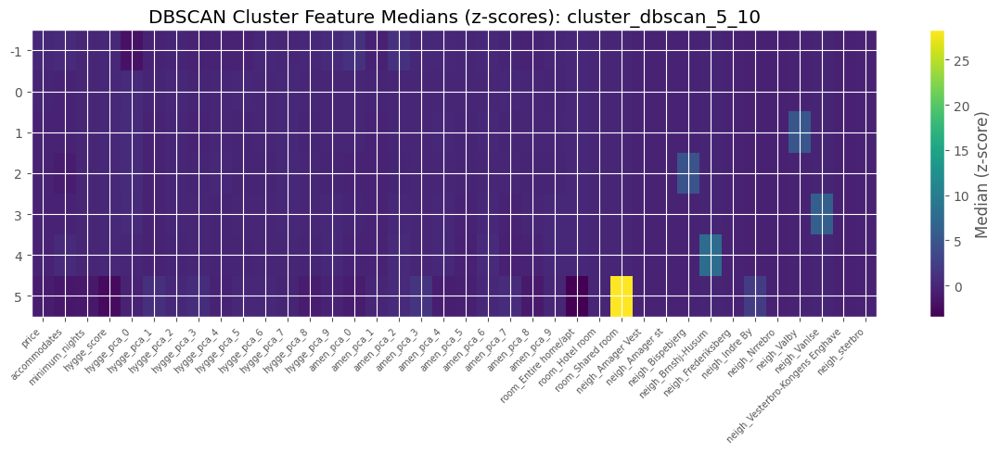


Features with |median z-score| >= 1.0 by cluster:

Cluster -1:
  hygge_pca_0: -1.90
  amen_pca_0: +1.10
  amen_pca_2: +1.08

Cluster 1:
  neigh_Valby: +5.03

Cluster 2:
  neigh_Bispebjerg: +4.73

Cluster 3:
  neigh_Vanlse: +6.22

Cluster 4:
  neigh_Brnshj-Husum: +7.76

Cluster 5:
  room_Shared room: +28.27
  room_Entire home/apt: -3.41
  hygge_score: -2.54
  neigh_Indre By: +2.24
  accommodates: -1.42
  amen_pca_3: +1.41
  minimum_nights: -1.27
  amen_pca_8: -1.11
  amen_pca_0: -1.04
  hygge_pca_8: -1.04



In [93]:
# 4) Run DBSCAN (eps=5, min_samples=5) and plot on the map using features_df for coords
labels_510, col_510 = run_dbscan(
    X_scaled=X_scaled,
    df_features=df_clustering,   # where cluster labels are stored
    eps=5,
    min_samples=10,
    col_prefix="cluster_dbscan",
    geo_df=features_df,          # has id + latitude + longitude
    id_col="id",
)

# 5) Interpret clusters: heatmap + standout features by z-score
summary_510 = interpret_clusters(
    df_clustering,
    cluster_col=col_510,   # "cluster_dbscan_5_5"
    z_threshold=1.0,
    top_n=None,
)

Estimated number of clusters: 4
Noise points: 40
Silhouette Score: 0.308
Davies–Bouldin Index: 1.914

Cluster sizes:
cluster_dbscan_7.5_5
-1       40
 0    12535
 1      208
 2       15
 3        6
Name: count, dtype: int64


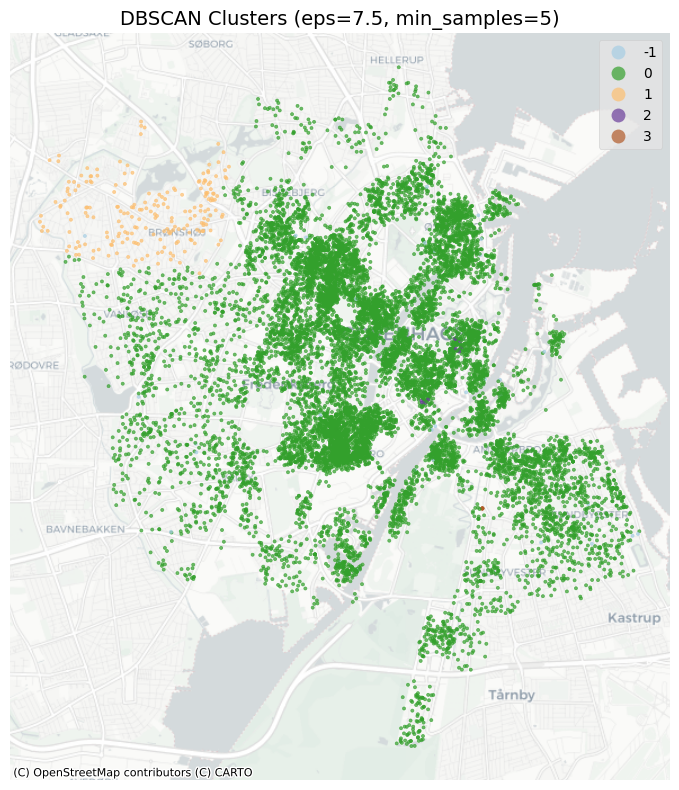

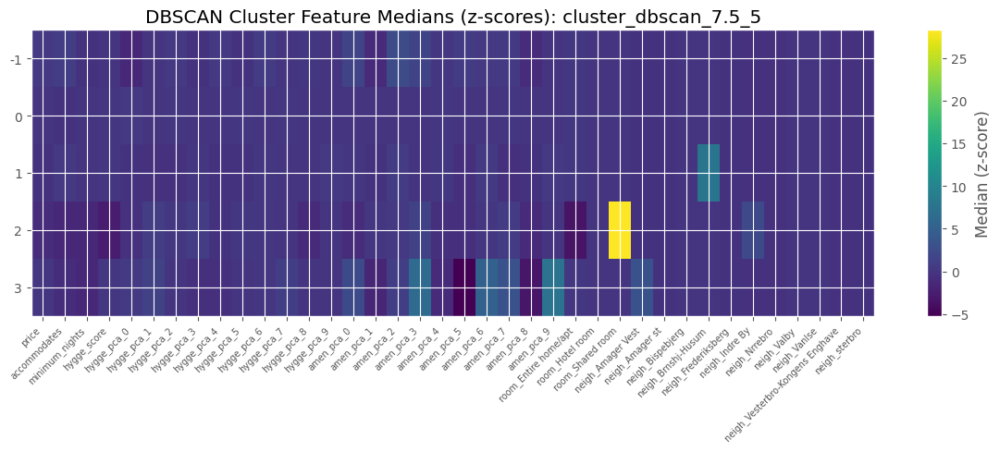


Features with |median z-score| >= 1.0 by cluster:

Cluster -1:
  amen_pca_2: +2.63
  amen_pca_3: +1.66
  amen_pca_0: +1.64
  hygge_pca_0: -1.40
  amen_pca_1: -1.06

Cluster 1:
  neigh_Brnshj-Husum: +7.76

Cluster 2:
  room_Shared room: +28.27
  room_Entire home/apt: -3.41
  hygge_score: -2.54
  neigh_Indre By: +2.24
  accommodates: -1.42
  minimum_nights: -1.27
  amen_pca_3: +1.26
  hygge_pca_8: -1.04
  amen_pca_8: -1.02

Cluster 3:
  amen_pca_9: +7.54
  amen_pca_3: +6.50
  amen_pca_5: -5.19
  amen_pca_6: +5.19
  amen_pca_7: +3.19
  neigh_Amager Vest: +3.18
  amen_pca_8: -3.15
  amen_pca_0: +2.27
  amen_pca_1: -1.57
  hygge_pca_1: +1.31
  minimum_nights: -1.27
  amen_pca_4: -1.11
  hygge_pca_7: +1.06
  amen_pca_2: +1.00



In [94]:
# 4) Run DBSCAN (eps=5, min_samples=5) and plot on the map using features_df for coords
labels_755, col_755 = run_dbscan(
    X_scaled=X_scaled,
    df_features=df_clustering,   # where cluster labels are stored
    eps=7.5,
    min_samples=5,
    col_prefix="cluster_dbscan",
    geo_df=features_df,          # has id + latitude + longitude
    id_col="id",
)

# 5) Interpret clusters: heatmap + standout features by z-score
summary_755 = interpret_clusters(
    df_clustering,
    cluster_col=col_755,   # "cluster_dbscan_5_5"
    z_threshold=1.0,
    top_n=None,
)

Estimated number of clusters: 3
Noise points: 49
Silhouette Score: 0.308
Davies–Bouldin Index: 2.154

Cluster sizes:
cluster_dbscan_7.5_10
-1       49
 0    12532
 1      208
 2       15
Name: count, dtype: int64


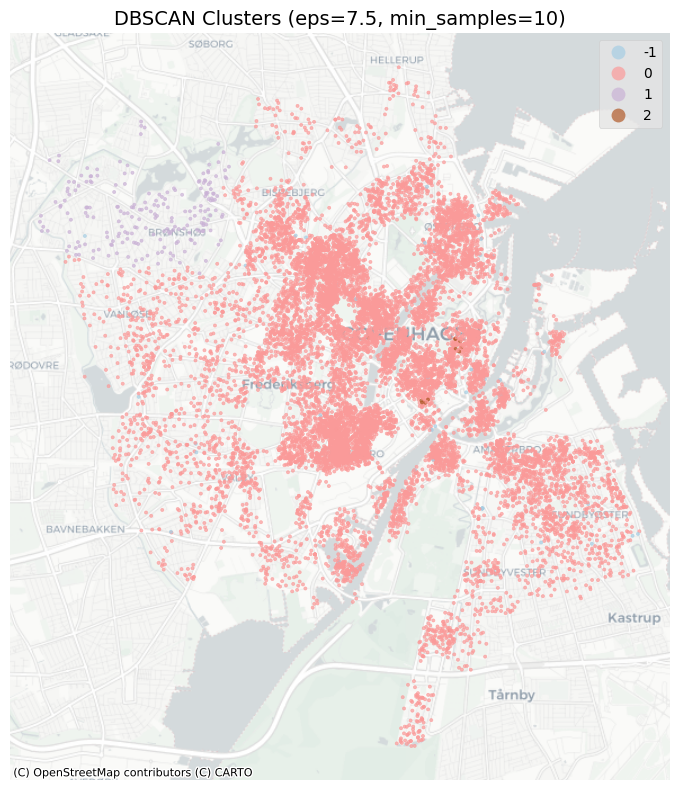

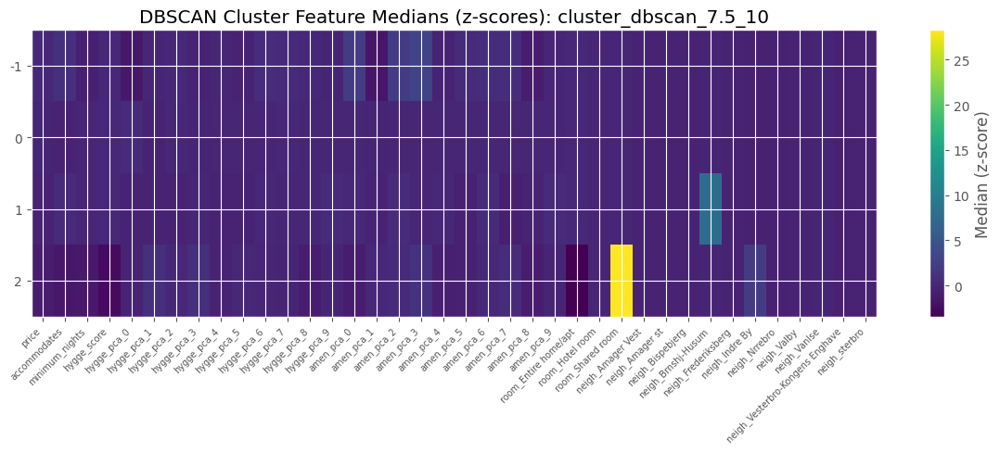


Features with |median z-score| >= 1.0 by cluster:

Cluster -1:
  amen_pca_3: +3.04
  amen_pca_2: +2.26
  amen_pca_0: +2.17
  amen_pca_1: -1.50
  hygge_pca_0: -1.33
  amen_pca_8: -1.00

Cluster 1:
  neigh_Brnshj-Husum: +7.76

Cluster 2:
  room_Shared room: +28.27
  room_Entire home/apt: -3.41
  hygge_score: -2.54
  neigh_Indre By: +2.24
  accommodates: -1.42
  minimum_nights: -1.27
  amen_pca_3: +1.26
  hygge_pca_8: -1.04
  amen_pca_8: -1.02



In [95]:
labels_7510, col_7510 = run_dbscan(
    X_scaled=X_scaled,
    df_features=df_clustering,
    eps=7.5,
    min_samples=10,
    col_prefix="cluster_dbscan",
    geo_df=features_df,
    id_col="id",
)

summary_7510 = interpret_clusters(
    df_clustering,
    cluster_col=col_7510,
    z_threshold=1.0,
    top_n=None,
)

## 4.2. K-means

### 4.2.1. Running elbow method to determine number of clusters

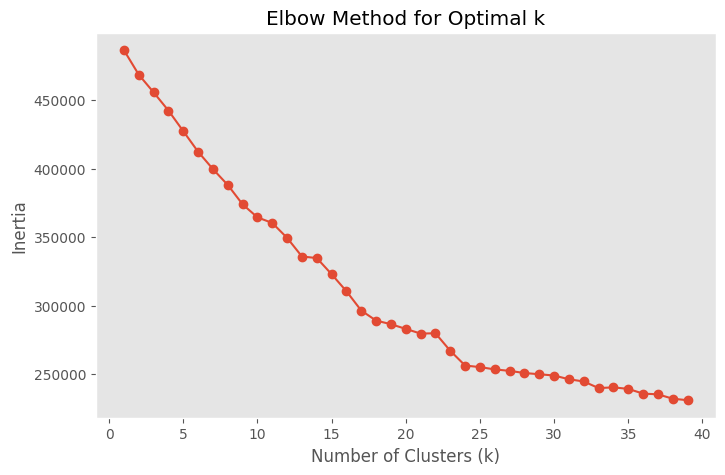

In [96]:
# Test a range of cluster numbers
inertia = []
K = range(1, 40)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid()
plt.show()

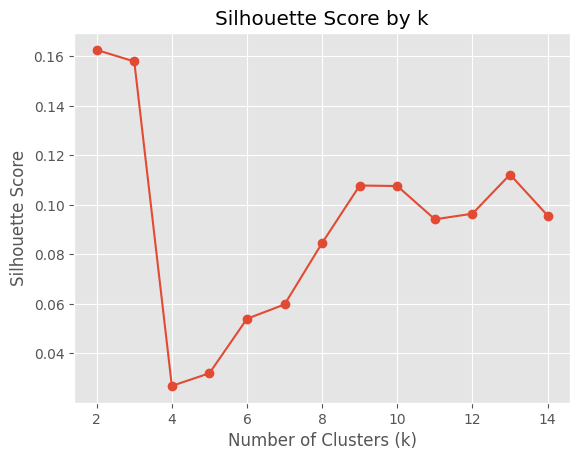

In [97]:
scores = []
K = range(2, 15)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    scores.append(silhouette_score(X_scaled, labels))

plt.plot(K, scores, 'o-')
plt.title('Silhouette Score by k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()


### 4.2.2. Final values and interpretation

Silhouette Score: 0.105
Davies–Bouldin Index: 2.356
cluster_kmeans
5    3470
0    2010
7    1867
2    1264
1    1258
4     971
3     875
9     487
6     393
8     209
Name: count, dtype: int64


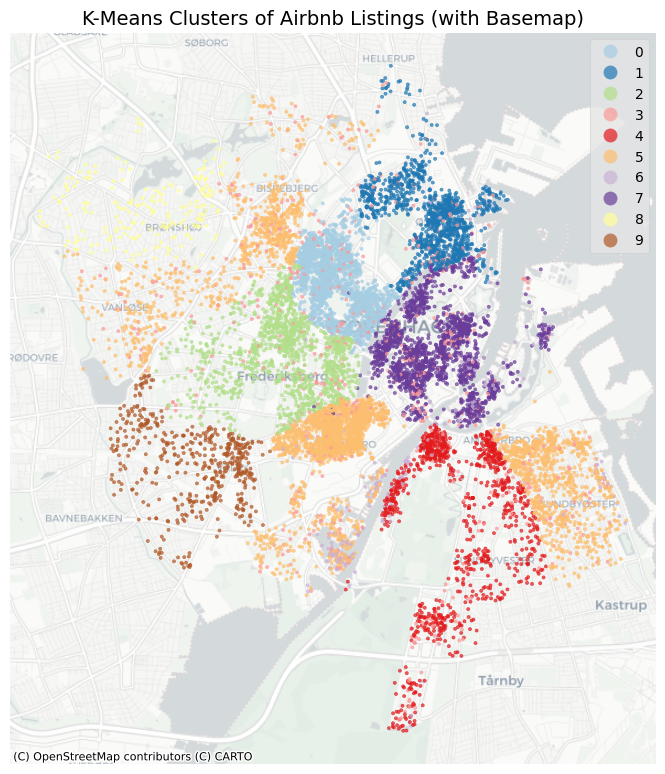

In [98]:
n_clusters = 10

# Initialize and fit the k-means model
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans.fit(X_scaled)

# Get the results
#print("Cluster centers:", kmeans.cluster_centers_)
labels = kmeans.labels_
# print("Labels for each point:", kmeans.labels_)

# Add cluster labels to your DataFrame
features_df['cluster_kmeans'] = labels

# Evaluate (if more than 1 cluster)
if n_clusters > 1:
    sil = silhouette_score(X_scaled, labels)
    dbi = davies_bouldin_score(X_scaled, labels)
    print(f"Silhouette Score: {sil:.3f}")
    print(f"Davies–Bouldin Index: {dbi:.3f}")

print(features_df['cluster_kmeans'].value_counts())

#gdf
gdf = gpd.GeoDataFrame(
    features_df,
    geometry=gpd.points_from_xy(features_df.longitude, features_df.latitude),
    crs="EPSG:4326"  # WGS84 (lat/lon)
)
gdf = gdf.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(
    ax=ax,
    column='cluster_kmeans',
    categorical=True,
    cmap='Paired',
    markersize=5,
    alpha=0.7,
    legend=True
)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("K-Means Clusters of Airbnb Listings (with Basemap)", fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()

In [99]:
num_cols = features_df.select_dtypes(include=[np.number]).columns

summary = (
    features_df
    .groupby('cluster_kmeans')[num_cols]
    .median()
    .round(2)
)

print(summary)

                          id  latitude  longitude   price  accommodates  \
cluster_kmeans                                                            
0               9.535401e+17     55.69      12.55  1100.0           3.0   
1               9.763680e+17     55.71      12.58  1200.0           3.0   
2               9.650278e+17     55.68      12.53  1249.5           3.0   
3               8.895945e+17     55.68      12.56   600.0           2.0   
4               9.681335e+17     55.66      12.58  1286.0           4.0   
5               9.744735e+17     55.67      12.55  1140.0           3.0   
6               6.388878e+17     55.66      12.57  1500.0           4.0   
7               8.928226e+17     55.68      12.58  1800.0           4.0   
8               8.724070e+17     55.71      12.49  1019.0           4.0   
9               9.853448e+17     55.66      12.51   945.0           4.0   

                minimum_nights  amenities_count  hygge_score  hygge_pca_0  \
cluster_kmeans        


Features with |median z-score| >= 1.0 by cluster:

Cluster 0:
  hygge_pca_51: +1.88
  hygge_pca_48: -1.61
  hygge_pca_32: +1.52
  hygge_pca_6: -1.37
  amen_pca_50: +1.34
  amen_pca_35: +1.28
  hygge_pca_82: -1.21
  hygge_pca_69: +1.19
  hygge_pca_13: -1.18
  hygge_pca_28: +1.17
  amen_pca_10: -1.17
  amen_pca_6: -1.15
  amen_pca_2: -1.14
  hygge_pca_66: -1.12
  hygge_pca_21: +1.09
  hygge_pca_24: +1.09
  amen_pca_65: -1.08
  amen_pca_12: +1.06
  hygge_pca_7: +1.06
  amen_pca_91: -1.05
  amen_pca_16: -1.03
  amen_pca_96: -1.02
  hygge_pca_5: -1.01
  amen_pca_86: -1.01

Cluster 1:
  hygge_pca_94: +1.60
  latitude: +1.59
  hygge_pca_67: +1.58
  amen_pca_71: -1.53
  amen_pca_89: -1.52
  amen_pca_58: -1.49
  amen_pca_56: -1.40
  hygge_pca_14: +1.40
  amen_pca_76: +1.30
  hygge_pca_46: -1.27
  hygge_pca_84: -1.16
  hygge_pca_53: +1.14
  hygge_pca_51: +1.13
  amen_pca_53: +1.12
  amen_pca_74: +1.06
  amen_pca_87: -1.06
  amen_pca_44: +1.06
  amen_pca_73: -1.03
  amen_pca_16: -1.03
  hygge_pc

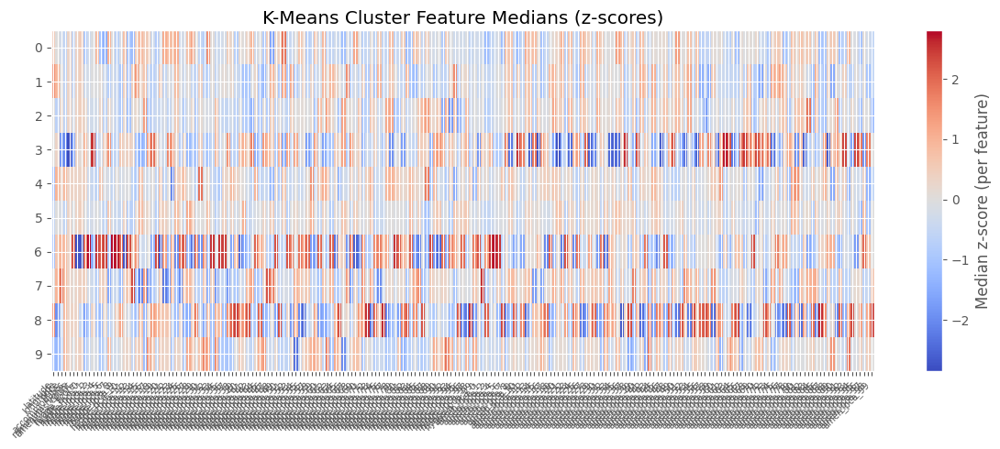

In [100]:

# 1. Keep only useful numeric feature columns
summary_num = summary.drop(columns=["id", "cluster_kmeans"], errors="ignore")

# 2. Z-score across clusters (per column)
summary_z = (summary_num - summary_num.mean()) / summary_num.std()
summary_z = summary_z.replace([np.inf, -np.inf], np.nan).fillna(0)

# 3. Prepare data for heatmap
data = summary_z.values
rows = summary_z.index.astype(str)        # cluster labels
cols = summary_z.columns                  # feature names

threshold = 1.0
print(f"\nFeatures with |median z-score| >= {threshold} by cluster:\n")

for cl, row in summary_z.iterrows():
    hits = row[row.abs() >= threshold]
    if hits.empty:
        continue
    hits = hits.reindex(hits.abs().sort_values(ascending=False).index)
    print(f"Cluster {cl}:")
    for feat, val in hits.items():
        print(f"  {feat}: {val:+.2f}")
    print()


# 4. Plot heatmap
fig, ax = plt.subplots(figsize=(12, 5))
im = ax.imshow(data, aspect="auto", cmap="coolwarm")

ax.set_xticks(np.arange(len(cols)))
ax.set_yticks(np.arange(len(rows)))
ax.set_xticklabels(cols, rotation=45, ha="right", fontsize=7)
ax.set_yticklabels(rows)

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Median z-score (per feature)", rotation=90)

ax.set_title("K-Means Cluster Feature Medians (z-scores)")
plt.tight_layout()
plt.show()

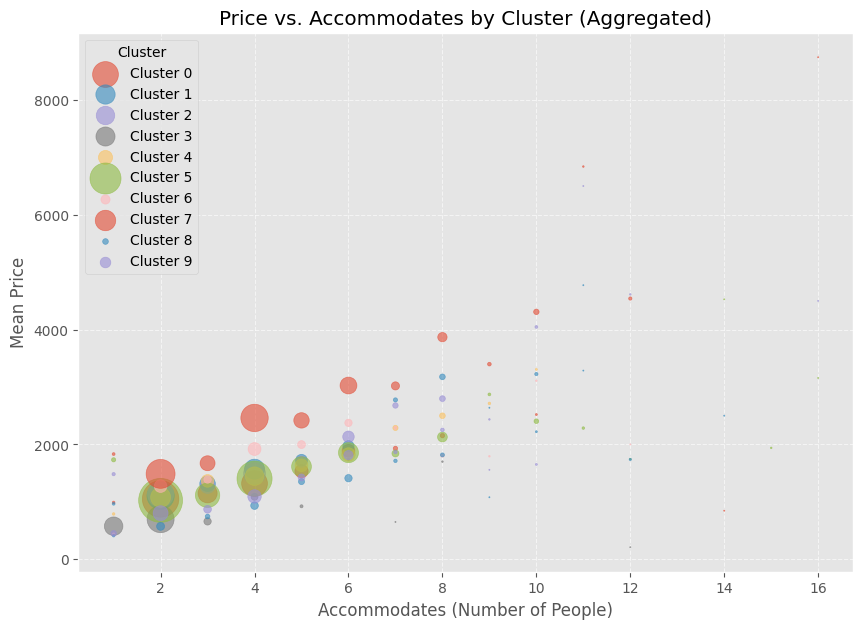

In [101]:
# Function to create the custom scatter plot
def plot_cluster_aggregates(features_df, x_col, y_col, cluster_col, title, xlabel, ylabel):
    # Group by x_col and cluster, calculate mean price and count of listings
    grouped = features_df.groupby([x_col, cluster_col]).agg(
        mean_price=(y_col, 'mean'),
        count=('id', 'size')
    ).reset_index()

    # Normalize the size of the circles for better visualization
    max_count = grouped['count'].max()
    grouped['size'] = grouped['count'] / max_count * 1000  # Scale sizes

    # Create the scatter plot
    plt.figure(figsize=(10, 7))
    for cluster in grouped[cluster_col].unique():
        cluster_data = grouped[grouped[cluster_col] == cluster]
        plt.scatter(cluster_data[x_col], cluster_data['mean_price'],
                    s=cluster_data['size'], label=f'Cluster {cluster}', alpha=0.6)

    # Add labels and legend
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title='Cluster')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# Plot: Price vs. Accommodates
plot_cluster_aggregates(features_df,
                        x_col='accommodates',
                        y_col='price',
                        cluster_col='cluster_kmeans',
                        title='Price vs. Accommodates by Cluster (Aggregated)',
                        xlabel='Accommodates (Number of People)',
                        ylabel='Mean Price')

# # Plot: Price vs. Bedrooms
# plot_cluster_aggregates(features_df,
#                         x_col='bedrooms',
#                         y_col='price',
#                         cluster_col='cluster_kmeans',
#                         title='Price vs. Bedrooms by Cluster (Aggregated)',
#                         xlabel='Number of Bedrooms',
#                         ylabel='Mean Price')

# # Plot: Price vs. Bathrooms
# plot_cluster_aggregates(features_df,
#                         x_col='bathrooms',
#                         y_col='price',
#                         cluster_col='cluster_kmeans',
#                         title='Price vs. Bathrooms by Cluster (Aggregated)',
#                         xlabel='Number of Bathrooms',
#                         ylabel='Mean Price')


C:\Users\lukac\AppData\Local\Temp\ipykernel_5416\610863144.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=features_df, x='cluster_kmeans', y='price_per_accommodates', ci=None, palette='viridis')
C:\Users\lukac\AppData\Local\Temp\ipykernel_5416\610863144.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=features_df, x='cluster_kmeans', y='price_per_accommodates', ci=None, palette='viridis')


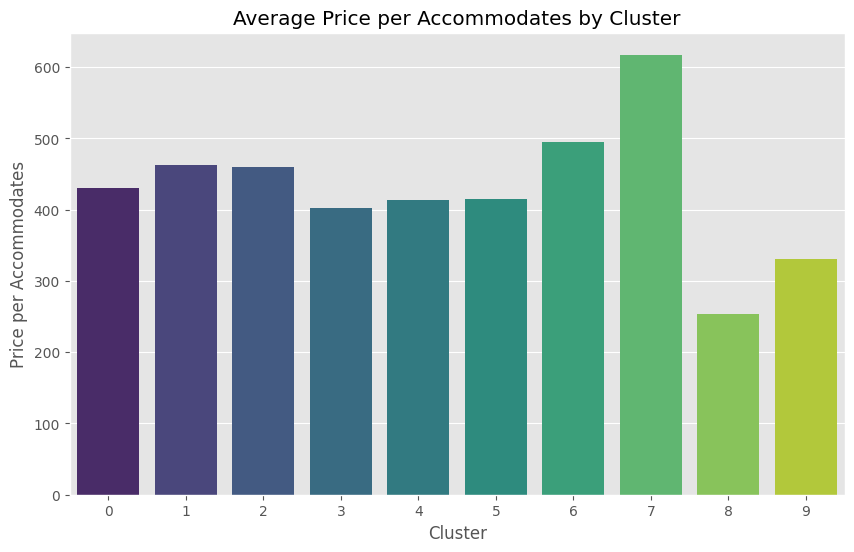

C:\Users\lukac\AppData\Local\Temp\ipykernel_5416\610863144.py:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=features_df, x='cluster_kmeans', discrete=True, shrink=0.8, palette='viridis')


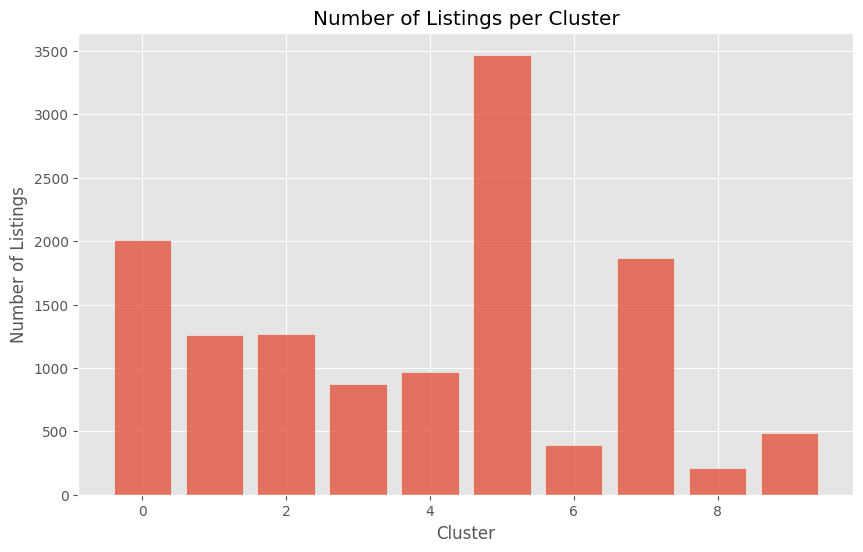

In [102]:
# Create a new column for price per accommodates
features_df['price_per_accommodates'] = features_df['price'] / features_df['accommodates']

# Bar Chart: Average price per accommodates by cluster
plt.figure(figsize=(10, 6))
sns.barplot(data=features_df, x='cluster_kmeans', y='price_per_accommodates', ci=None, palette='viridis')
plt.title('Average Price per Accommodates by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Price per Accommodates')
plt.show()

# Histogram: Number of listings per cluster
plt.figure(figsize=(10, 6))
sns.histplot(data=features_df, x='cluster_kmeans', discrete=True, shrink=0.8, palette='viridis')
plt.title('Number of Listings per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Listings')
plt.show()
